In [1]:
import dask.dataframe as dd #similar to pandas
import pandas as pd #pandas to create small dataframes 
import folium #open street map
import datetime #Convert to unix time
import time #Convert to unix time
import numpy as np
import matplotlib
# matplotlib.use('nbagg') : matplotlib uses this protocall which makes plots more user intractive like zoom in and zoom out
matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns#Plots
from matplotlib import rcParams#Size of plots  
# this lib is used while we calculate the stight line distance between two (lat,lon) pairs in miles
import gpxpy.geo #Get the haversine distance
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
from scipy import stats as stat
import math
import pickle
import os
import joblib

# download migwin: https://mingw-w64.org/doku.php/download/mingw-builds
# install it in your system and keep the path, migw_path ='installed path'
mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-5.3.0-posix-seh-rt_v4-rev0\\mingw64\\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']

# if it didnt happen check install_xgboost.JPG
import xgboost as xgb

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

In [7]:
#Looking at the features
month = dd.read_csv('yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


In [3]:
#Looking at the entire data
month.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


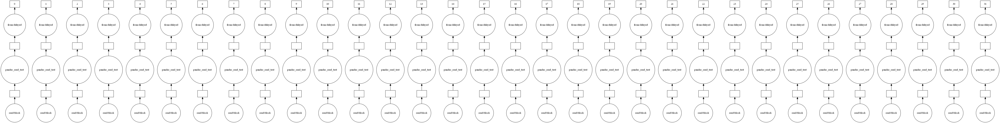

In [4]:
month.visualize()

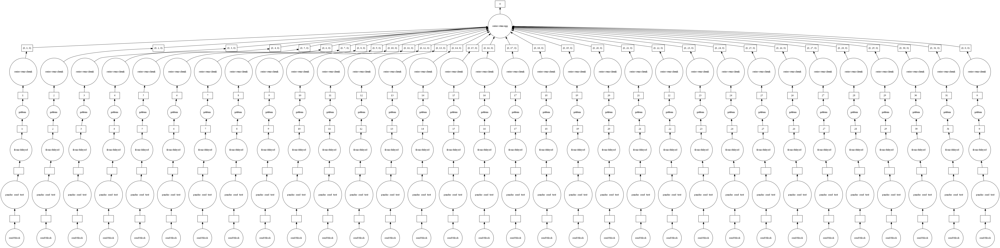

In [5]:
month.fare_amount.sum().visualize()

### Data Cleaning 

#### 1. Pickup Latitude and Pickup Longitude 

In [6]:
# Plotting pickup cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774)| \
                   (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

# note: you dont need to remember any of these, you dont need indeepth knowledge on these maps and plots

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# we will spot only first 100 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

##### Observation:- As you can see above that there are some points just outside the boundary but there are a few that are in either South america, Mexico or Canada 

### Dropoff Latitude & Dropoff Longitude 

###### It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) so hence any cordinates not within these cordinates are not considered by us as we are only concerned with dropoffs which are within New York 

In [7]:
# Plotting dropoff cordinates which are outside the bounding box of New-York 
# we will collect all the points outside the bounding box of newyork city to outlier_locations
outlier_locations = month[((month.dropoff_longitude <= -74.15) | (month.dropoff_latitude <= 40.5774)| \
                   (month.dropoff_longitude >= -73.7004) | (month.dropoff_latitude >= 40.9176))]

# creating a map with the a base location
# read more about the folium here: http://folium.readthedocs.io/en/latest/quickstart.html

# note: you dont need to remember any of these, you dont need indeepth knowledge on these maps and plots

map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# we will spot only first 100 outliers on the map, plotting all the outliers will take more time
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['dropoff_latitude'],j['dropoff_longitude']))).add_to(map_osm)
map_osm

##### Observation:- The observations here are similar to those obtained while analysing pickup latitude and longitude 

### Trip Durations: 

In [25]:
#The timestamps are converted to unix so as to get duration(trip-time) & speed also pickup-times in unix are used while binning 
# in out data we have time in the formate "YYYY-MM-DD HH:MM:SS" we convert thiss sting to python time formate and then into unix time stamp
# https://stackoverflow.com/a/27914405

def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())


def return_with_trip_times(month):
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    #append durations of trips and speed in miles/hr to a new dataframe
    new_frame = month[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']].compute()
    
    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])
    
    print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))
    return new_frame

startTime3 = datetime.datetime.now()
frame_with_durations = return_with_trip_times(month)

#Saving the file                         
joblib.dump(frame_with_durations,"frame_with_durations.pkl")

Time taken for creation of dataframe is 0:47:20.508857


['frame_with_durations.pkl']

In [8]:
#Loading data
frame_with_durations = joblib.load("frame_with_durations.pkl")

<IPython.core.display.Javascript object>


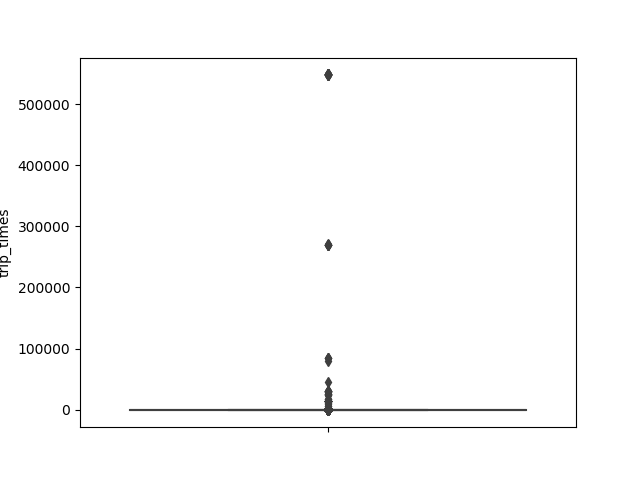

In [9]:
# the skewed box plot shows us the presence of outliers 
sns.boxplot(y="trip_times", data =frame_with_durations)
plt.show()

In [10]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is -1211.0166666666667
10 percentile value is 3.8333333333333335
20 percentile value is 5.383333333333334
30 percentile value is 6.816666666666666
40 percentile value is 8.3
50 percentile value is 9.95
60 percentile value is 11.866666666666667
70 percentile value is 14.283333333333333
80 percentile value is 17.633333333333333
90 percentile value is 23.45
100 percentile value is  548555.6333333333


In [11]:
#looking further from the 99th percecntile
for i in range(90,100):
    var =frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is  548555.6333333333


In [10]:
#removing data based on our analysis and TLC regulations
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_times>1) & (frame_with_durations.trip_times<720)]

<IPython.core.display.Javascript object>


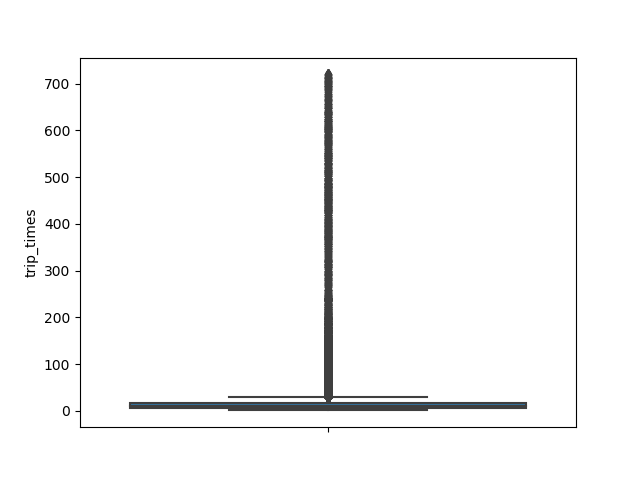

In [11]:
#box-plot after removal of outliers
sns.boxplot(y="trip_times", data =frame_with_durations_modified)
plt.show()

<IPython.core.display.Javascript object>


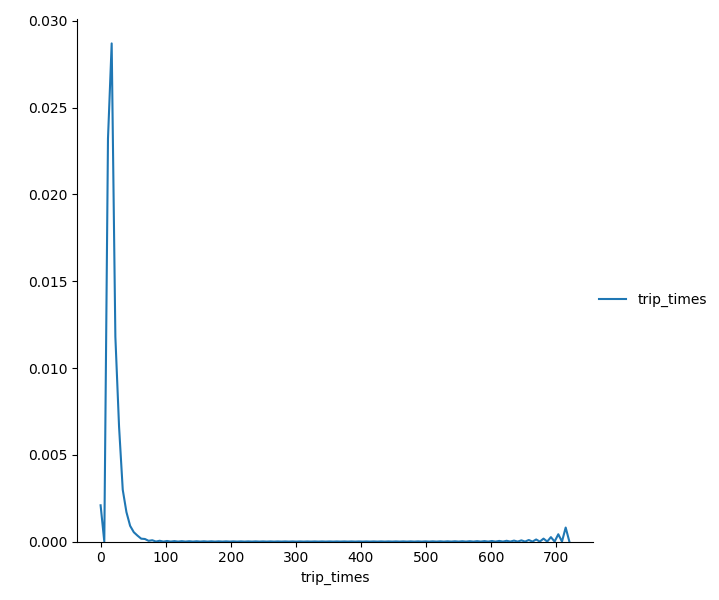

In [12]:
#pdf of trip-times after removing the outliers
sns.FacetGrid(frame_with_durations_modified,size=6) \
      .map(sns.kdeplot,"trip_times") \
      .add_legend();
plt.show();

In [13]:
#converting the values to log-values to chec for log-normal
import math
frame_with_durations_modified['log_times']=[math.log(i) for i in frame_with_durations_modified['trip_times'].values]

<IPython.core.display.Javascript object>


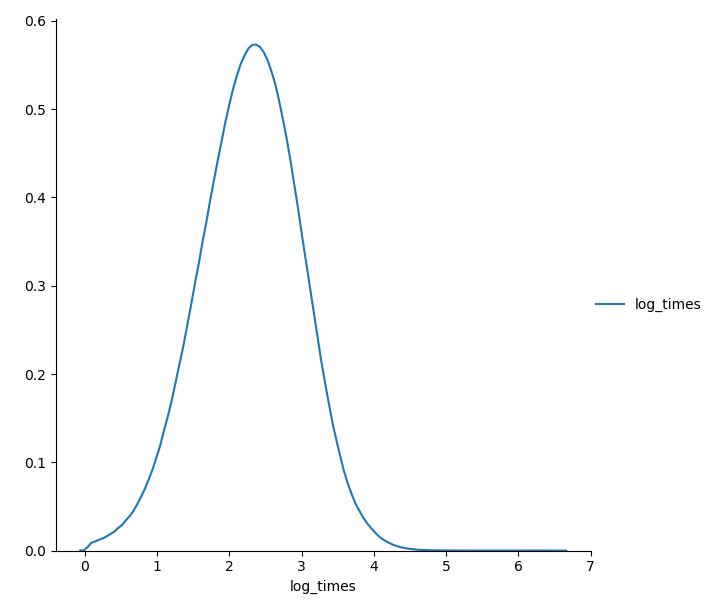

In [14]:
#pdf of log-values
sns.FacetGrid(frame_with_durations_modified,size=6) \
      .map(sns.kdeplot,"log_times") \
      .add_legend();
plt.show();

<IPython.core.display.Javascript object>


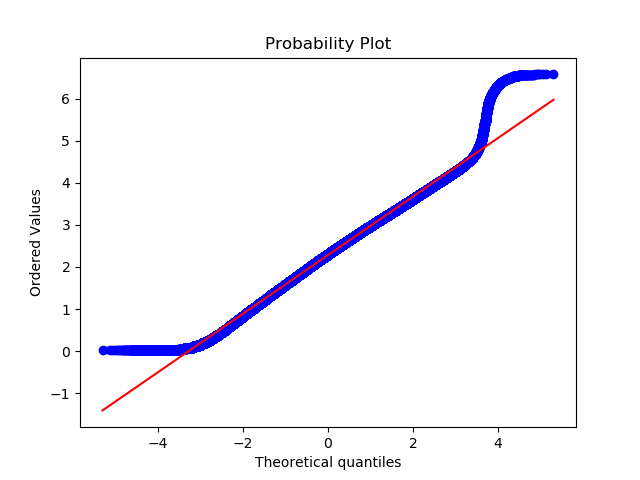

In [16]:
#Q-Q plot for checking if trip-times is log-normal
stat.probplot(frame_with_durations_modified['log_times'].values, plot=plt)
plt.show()

### Speed 

<IPython.core.display.Javascript object>


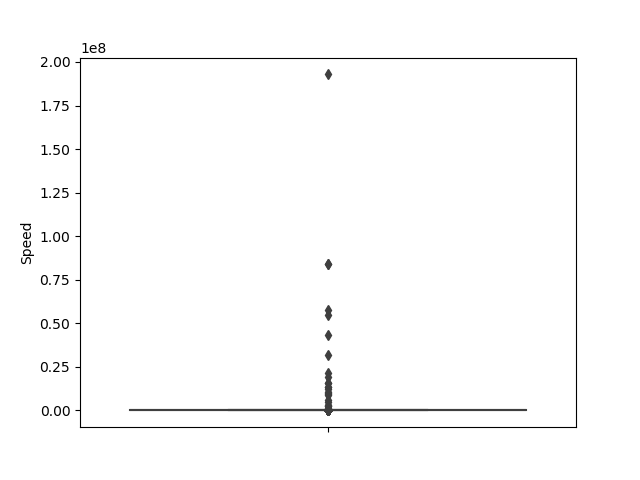

In [17]:
# check for any outliers in the data after trip duration outliers removed
# box-plot for speeds with outliers
frame_with_durations_modified['Speed'] = 60*(frame_with_durations_modified['trip_distance']/frame_with_durations_modified['trip_times'])
sns.boxplot(y="Speed", data =frame_with_durations_modified)
plt.show()

In [19]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [20]:
#calculating speed values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [21]:
#calculating speed values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


In [22]:
#removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.Speed>0) & (frame_with_durations.Speed<45.31)]

In [23]:
#avg.speed of cabs in New-York
sum(frame_with_durations_modified["Speed"]) / float(len(frame_with_durations_modified["Speed"]))

12.450173996027528

# <b style='font-size:16px'>The avg speed in Newyork speed is 12.45miles/hr, so a cab driver can travel <font color='blue'> 2 miles per 10min on avg.</font> </b>

### Trip Distance 

<IPython.core.display.Javascript object>


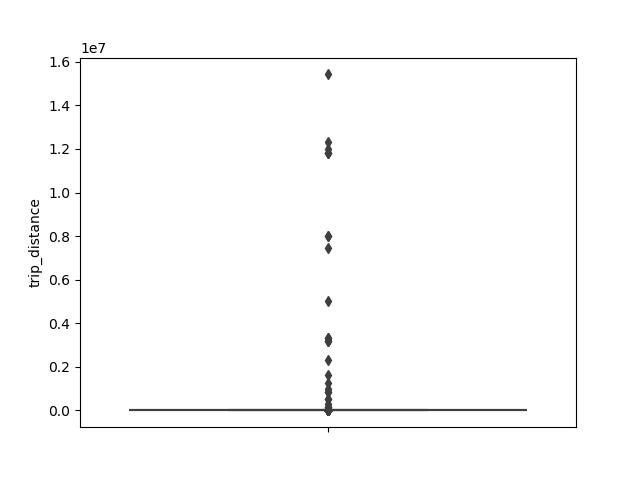

In [18]:
# up to now we have removed the outliers based on trip durations and cab speeds
# lets try if there are any outliers in trip distances
# box-plot showing outliers in trip-distance values
sns.boxplot(y="trip_distance", data =frame_with_durations_modified)
plt.show()

In [25]:
#calculating trip distance values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.66
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.69
60 percentile value is 2.07
70 percentile value is 2.6
80 percentile value is 3.6
90 percentile value is 5.97
100 percentile value is  258.9


In [26]:
#calculating trip distance values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 5.97
91 percentile value is 6.45
92 percentile value is 7.07
93 percentile value is 7.85
94 percentile value is 8.72
95 percentile value is 9.6
96 percentile value is 10.6
97 percentile value is 12.1
98 percentile value is 16.03
99 percentile value is 18.17
100 percentile value is  258.9


In [27]:
#calculating trip distance values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.17
99.1 percentile value is 18.37
99.2 percentile value is 18.6
99.3 percentile value is 18.83
99.4 percentile value is 19.13
99.5 percentile value is 19.5
99.6 percentile value is 19.96
99.7 percentile value is 20.5
99.8 percentile value is 21.22
99.9 percentile value is 22.57
100 percentile value is  258.9


In [28]:
#removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_distance>0) & (frame_with_durations.trip_distance<23)]

<IPython.core.display.Javascript object>


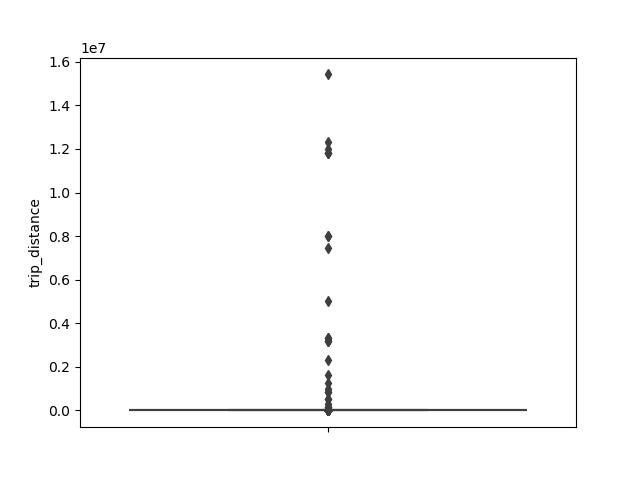

In [19]:
#box-plot after removal of outliers
sns.boxplot(y="trip_distance", data = frame_with_durations_modified)
plt.show()

###  Total Fare

<IPython.core.display.Javascript object>


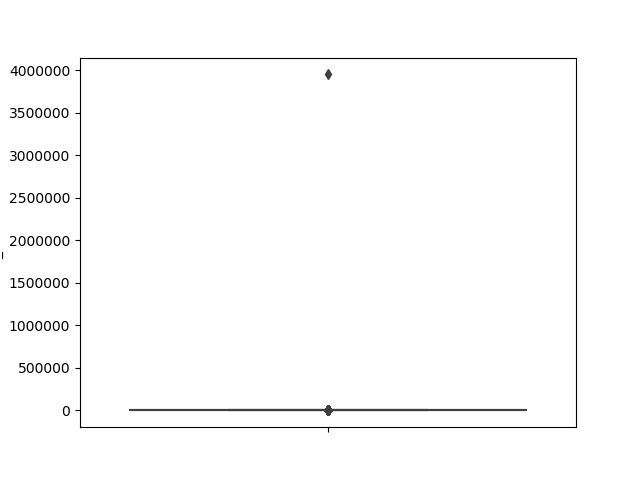

In [20]:
# up to now we have removed the outliers based on trip durations, cab speeds, and trip distances
# lets try if there are any outliers in based on the total_amount
# box-plot showing outliers in fare
sns.boxplot(y="total_amount", data =frame_with_durations_modified)
plt.show()

In [31]:
#calculating total fare amount values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.3
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [32]:
#calculating total fare amount values at each percntile 90,91,92,93,94,95,96,97,98,99,100
for i in range(90,100):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.3
93 percentile value is 31.8
94 percentile value is 34.8
95 percentile value is 38.53
96 percentile value is 42.6
97 percentile value is 48.13
98 percentile value is 58.13
99 percentile value is 66.13
100 percentile value is  3950611.6


In [22]:
#calculating total fare amount values at each percntile 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
for i in np.arange(0.0, 1.0, 0.1):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 68.13
99.1 percentile value is 69.13
99.2 percentile value is 69.6
99.3 percentile value is 69.73
99.4 percentile value is 69.73
99.5 percentile value is 69.76
99.6 percentile value is 72.46
99.7 percentile value is 72.73
99.8 percentile value is 80.05
99.9 percentile value is 95.55
100 percentile value is  3950611.6


#### <b>Observation:-</b> As even the 99.9th percentile value doesnt look like an outlier,as there is not much difference between the 99.8th percentile and 99.9th percentile, we move on to do graphical analyis

<IPython.core.display.Javascript object>


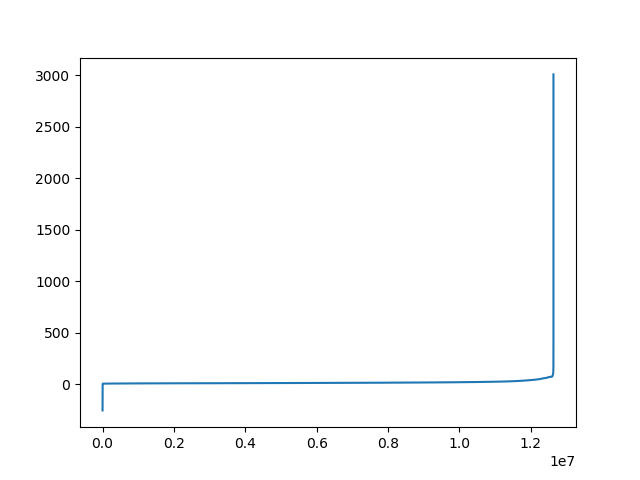

In [23]:
#below plot shows us the fare values(sorted) to find a sharp increase to remove those values as outliers
# plot the fare amount excluding last two values in sorted data
plt.plot(var[:-2])
plt.show()

<IPython.core.display.Javascript object>


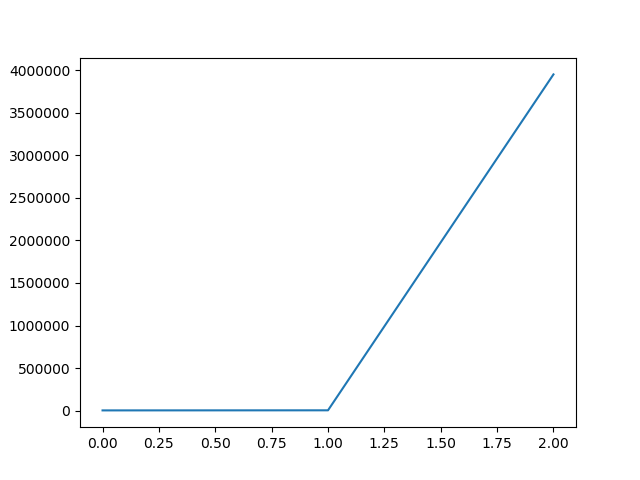

In [24]:
# a very sharp increase in fare values can be seen 
# plotting last three total fare values, and we can observe there is share increase in the values
plt.plot(var[-3:])
plt.show()

<IPython.core.display.Javascript object>


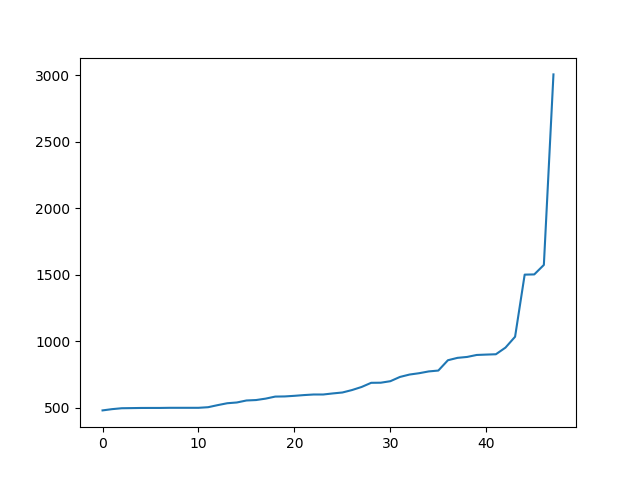

In [25]:
#now looking at values not including the last two points we again find a drastic increase at around 1000 fare value
# we plot last 50 values excluding last two values
plt.plot(var[-50:-2])
plt.show()

### Remove all outliers/erronous points. 

In [35]:
#removing all outliers based on our univariate analysis above
def remove_outliers(new_frame):

    
    a = new_frame.shape[0]
    print ("Number of pickup records = ",a)
    temp_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    b = temp_frame.shape[0]
    print ("Number of outlier coordinates lying outside NY boundaries:",(a-b))

    
    temp_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    c = temp_frame.shape[0]
    print ("Number of outliers from trip times analysis:",(a-c))
    
    
    temp_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    d = temp_frame.shape[0]
    print ("Number of outliers from trip distance analysis:",(a-d))
    
    temp_frame = new_frame[(new_frame.Speed <= 65) & (new_frame.Speed >= 0)]
    e = temp_frame.shape[0]
    print ("Number of outliers from speed analysis:",(a-e))
    
    temp_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    f = temp_frame.shape[0]
    print ("Number of outliers from fare analysis:",(a-f))
    
    
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    new_frame = new_frame[(new_frame.Speed < 45.31) & (new_frame.Speed > 0)]
    new_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    
    print ("Total outliers removed",a - new_frame.shape[0])
    print ("---")
    return new_frame

In [36]:
startTime4 = datetime.datetime.now()
print ("Removing outliers in the month of Jan-2015")
print ("----")
frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
print("fraction of data points that remain after removing outliers", float(len(frame_with_durations_outliers_removed))/len(frame_with_durations))
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime4))

Removing outliers in the month of Jan-2015
----
Number of pickup records =  12748986
Number of outlier coordinates lying outside NY boundaries: 293919
Number of outliers from trip times analysis: 23889
Number of outliers from trip distance analysis: 92597
Number of outliers from speed analysis: 24473
Number of outliers from fare analysis: 5275
Total outliers removed 377910
---
fraction of data points that remain after removing outliers 0.9703576425607495
Time taken for creation of dataframe is 0:02:24.422998


## Data-preperation
### Clustering/Segmentation 

In [37]:
#trying different cluster sizes to choose the right K in K-means
startTime5 = datetime.datetime.now()
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
neighbours=[]

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    less2 = []
    more2 = []
    min_dist=1000
    for i in range(0, cluster_len):
        nice_points = 0
        wrong_points = 0
        for j in range(0, cluster_len):
            if j!=i:
                distance = gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1])
                min_dist = min(min_dist,distance/(1.60934*1000))
                if (distance/(1.60934*1000)) <= 2:
                    nice_points +=1
                else:
                    wrong_points += 1
        less2.append(nice_points)
        more2.append(wrong_points)
    neighbours.append(less2)
    print ("On choosing a cluster size of ",cluster_len,"\nAvg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2):", np.ceil(sum(less2)/len(less2)), "\nAvg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2):", np.ceil(sum(more2)/len(more2)),"\nMin inter-cluster distance = ",min_dist,"\n---")

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000,random_state=42).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

# we need to choose number of clusters so that, there are more number of cluster regions 
#that are close to any cluster center
# and make sure that the minimum inter cluster should not be very less
for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    find_min_distance(cluster_centers, cluster_len)      

print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime5))

On choosing a cluster size of  10 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 2.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 8.0 
Min inter-cluster distance =  1.0945442325142543 
---
On choosing a cluster size of  20 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 16.0 
Min inter-cluster distance =  0.7131298007387813 
---
On choosing a cluster size of  30 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 22.0 
Min inter-cluster distance =  0.5185088176172206 
---
On choosing a cluster size of  40 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 32.0 
Min inter-cluster distance 

#### Inference:
- The main objective was to find a optimal min. distance(Which roughly estimates to the radius of a cluster) between the clusters which we got was 40 

In [39]:
# if check for the 50 clusters you can observe that there are two clusters with only 0.3 miles apart from each other
# so we choose 40 clusters for solve the further problem

# Getting 40 clusters using the kmeans 
startTime6 = datetime.datetime.now()
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000,random_state=0).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime6))

Time taken for creation of dataframe is 0:01:23.665194


### Plotting the clusters centers 

In [41]:
# Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

### Plotting the clusters 

In [42]:
#Visualising the clusters on a map
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
               c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

<IPython.core.display.Javascript object>

### Time-binning 

In [18]:
#Refer:https://www.unixtimestamp.com/
# 1420070400 : 2015-01-01 00:00:00 
# 1422748800 : 2015-02-01 00:00:00 
# 1425168000 : 2015-03-01 00:00:00
# 1427846400 : 2015-04-01 00:00:00 
# 1430438400 : 2015-05-01 00:00:00 
# 1433116800 : 2015-06-01 00:00:00

# 1451606400 : 2016-01-01 00:00:00 
# 1454284800 : 2016-02-01 00:00:00 
# 1456790400 : 2016-03-01 00:00:00
# 1459468800 : 2016-04-01 00:00:00 
# 1462060800 : 2016-05-01 00:00:00 
# 1464739200 : 2016-06-01 00:00:00

def add_pickup_bins(frame,month,year):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
    start_pickup_unix=unix_times[year-2015][month-1]
    # https://www.timeanddate.com/time/zones/est
    # (int((i-start_pickup_unix)/600)+33) : our unix time is in gmt to we are converting it to est
    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [20]:
# clustering, making pickup bins and grouping by pickup cluster and pickup bins
startTime7 = datetime.datetime.now()
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
jan_2015_frame = add_pickup_bins(frame_with_durations_outliers_removed,1,2015)
jan_2015_groupby = jan_2015_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime7))

#Saving the file                         
joblib.dump(jan_2015_frame,"jan_2015_frame.pkl")
joblib.dump(jan_2015_groupby,"jan_2015_groupby.pkl")

Time taken for creation of dataframe is 0:02:24.616199


['jan_2015_groupby.pkl']

In [26]:
#Loading data

jan_2015_frame = joblib.load("jan_2015_frame.pkl")
jan_2015_groupby = joblib.load("jan_2015_groupby.pkl")

In [17]:
# we add two more columns 'pickup_cluster'(to which cluster it belogns to) 
# and 'pickup_bins' (to which 10min intravel the trip belongs to)
jan_2015_frame.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed,pickup_cluster,pickup_bins
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421329e+09,5.285319,34,2130
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420902e+09,9.983193,2,1419
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420902e+09,10.746269,16,1419
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420902e+09,16.071429,38,1419
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420902e+09,9.318378,22,1419


In [18]:
# here the trip_distance represents the number of pickups that are happend in that particular 10min intravel
# this data frame has two indices
# primary index: pickup_cluster (cluster number)
# secondary index : pickup_bins (we devide whole months time into 10min intravels 24*31*60/10 =4464bins)
jan_2015_groupby.head()

trip_distance
pickup_cluster pickup_bins               
0              1                      105
               2                      199
               3                      208
               4                      141
               5                      155

In [19]:
# upto now we cleaned data and prepared data for the month 2015,

# now do the same operations for months Jan, Feb, March of 2016
# 1. get the dataframe which inlcudes only required colums
# 2. adding trip times, speed, unix time stamp of pickup_time
# 4. remove the outliers based on trip_times, speed, trip_duration, total_amount
# 5. add pickup_cluster to each data point
# 6. add pickup_bin (index of 10min intravel to which that trip belongs to)
# 7. group by data, based on 'pickup_cluster' and 'pickuo_bin'

# Data Preparation for the months of Jan,Feb and March 2016
def datapreparation(month,kmeans,month_no,year_no):
    
    print ("Return with trip times..")

    frame_with_durations = return_with_trip_times(month)
    
    print ("Remove outliers..")
    frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
    
    print ("Estimating clusters..")
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    #frame_with_durations_outliers_removed_2016['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed_2016[['pickup_latitude', 'pickup_longitude']])

    print ("Final groupbying..")
    final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed,month_no,year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
    
    return final_updated_frame,final_groupby_frame
    

startTime4 = datetime.datetime.now()

month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')

jan_2016_frame,jan_2016_groupby = datapreparation(month_jan_2016,kmeans,1,2016)
feb_2016_frame,feb_2016_groupby = datapreparation(month_feb_2016,kmeans,2,2016)
mar_2016_frame,mar_2016_groupby = datapreparation(month_mar_2016,kmeans,3,2016)

#Saving the file                         
joblib.dump(jan_2016_frame,"jan_2016_frame.pkl")
joblib.dump(jan_2016_groupby,"jan_2016_groupby.pkl")

joblib.dump(feb_2016_frame,"feb_2016_frame.pkl")
joblib.dump(feb_2016_groupby,"feb_2016_groupby.pkl")

joblib.dump(mar_2016_frame,"mar_2016_frame.pkl")
joblib.dump(mar_2016_groupby,"mar_2016_groupby.pkl")

print("Time taken 4 = "+str(datetime.datetime.now() - startTime4))

Return with trip times..
Time taken for creation of dataframe is 2:01:49.887643
Remove outliers..
Number of pickup records =  10906858
Number of outlier coordinates lying outside NY boundaries: 214677
Number of outliers from trip times analysis: 27190
Number of outliers from trip distance analysis: 79742
Number of outliers from speed analysis: 21047
Number of outliers from fare analysis: 4991
Total outliers removed 297784
---
Estimating clusters..
Final groupbying..
Return with trip times..
Time taken for creation of dataframe is 2:48:09.229424
Remove outliers..
Number of pickup records =  11382049
Number of outlier coordinates lying outside NY boundaries: 223161
Number of outliers from trip times analysis: 27670
Number of outliers from trip distance analysis: 81902
Number of outliers from speed analysis: 22437
Number of outliers from fare analysis: 5476
Total outliers removed 308177
---
Estimating clusters..
Final groupbying..
Return with trip times..
Time taken for creation of datafr

In [27]:
#Loading data

jan_2016_frame = joblib.load("jan_2016_frame.pkl")
jan_2016_groupby = joblib.load("jan_2016_groupby.pkl")

feb_2016_frame = joblib.load("feb_2016_frame.pkl")
feb_2016_groupby = joblib.load("feb_2016_groupby.pkl")

mar_2016_frame = joblib.load("mar_2016_frame.pkl")
mar_2016_groupby = joblib.load("mar_2016_groupby.pkl")

### Smoothing 

In [9]:
# Gets the unique bins where pickup values are present for each each reigion

# for each cluster region we will collect all the indices of 10min intravels in which the pickups are happened
# we got an observation that there are some pickpbins that doesnt have any pickups
def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [10]:
# for every month we get all indices of 10min intravels in which atleast one pickup got happened

#jan
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)

#feb
feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)

#march
mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

In [11]:
# for each cluster number of 10min intravels with 0 pickups
for i in range(40):
    print("for the ",i,"th cluster number of 10min intavels with zero pickups: ",4464 - len(set(jan_2015_unique[i])))
    print('-'*60)

for the  0 th cluster number of 10min intavels with zero pickups:  41
------------------------------------------------------------
for the  1 th cluster number of 10min intavels with zero pickups:  1986
------------------------------------------------------------
for the  2 th cluster number of 10min intavels with zero pickups:  30
------------------------------------------------------------
for the  3 th cluster number of 10min intavels with zero pickups:  355
------------------------------------------------------------
for the  4 th cluster number of 10min intavels with zero pickups:  38
------------------------------------------------------------
for the  5 th cluster number of 10min intavels with zero pickups:  154
------------------------------------------------------------
for the  6 th cluster number of 10min intavels with zero pickups:  35
------------------------------------------------------------
for the  7 th cluster number of 10min intavels with zero pickups:  34
---------

In [12]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min intravel
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min intravel(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add 0 to the smoothed data
# we finally return smoothed data
def fill_missing(count_values,values):
    smoothed_regions=[]
    ind=0
    for r in range(0,40):
        smoothed_bins=[]
        for i in range(4464):
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
                ind+=1
            else:
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [13]:
# Fills a value of zero for every bin where no pickup data is present 
# the count_values: number pickps that are happened in each region for each 10min intravel
# there wont be any value if there are no picksups.
# values: number of unique bins

# for every 10min intravel(pickup_bin) we will check it is there in our unique bin,
# if it is there we will add the count_values[index] to smoothed data
# if not we add smoothed data (which is calculated based on the methods that are discussed in the above markdown cell)
# we finally return smoothed data
def smoothing(count_values,values):
    smoothed_regions=[] # stores list of final smoothed values of each reigion
    ind=0
    repeat=0 
    smoothed_value=0
    for r in range(0,40):
        smoothed_bins=[] #stores the final smoothed values
        repeat=0
        for i in range(4464):
            if repeat!=0: # prevents iteration for a value which is already visited/resolved
                repeat-=1
                continue
            if i in values[r]: #checks if the pickup-bin exists 
                smoothed_bins.append(count_values[ind]) # appends the value of the pickup bin if it exists
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]: #searches for the left-limit or the pickup-bin value which has a pickup value
                            continue
                        else:
                            right_hand_limit=j
                            break
                    if right_hand_limit==0:
                    #Case 1: When we have the last/last few values are found to be missing,hence we have no right-limit here
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                    #Case 2: When we have the missing values between two known values
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    #Case 3: When we have the first/first few values are found to be missing,hence we have no left-limit here
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions


In [14]:
#Filling Missing values of Jan-2015 with 0
# here in jan_2015_groupby dataframe the trip_distance represents the number of pickups that are happened
jan_2015_fill = fill_missing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

#Smoothing Missing values of Jan-2015
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

In [15]:
print("Total number of pickup values = "+str(len(jan_2015_fill)))
print("Total number of pickup values = "+str(len(jan_2015_smooth)))

Total number of pickup values = 178560
Total number of pickup values = 178560


In [11]:
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*30*60/10 = 4320
# for each cluster we will have 4464 values, therefore 40*4464 = 178560 (length of the jan_2015_fill)
print("number of 10min intravels among all the clusters ",len(jan_2015_fill))

number of 10min intravels among all the clusters  178560


<IPython.core.display.Javascript object>


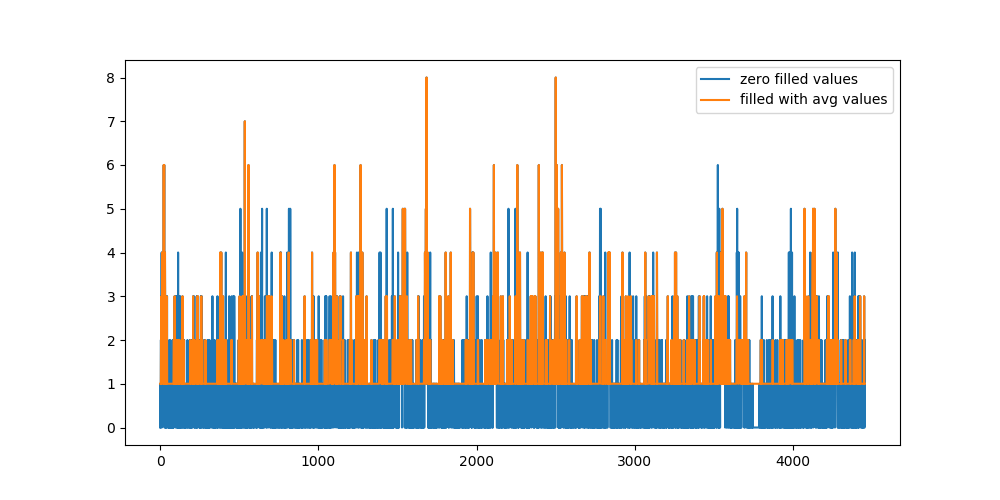

In [23]:
# Smoothing vs Filling
# sample plot that shows two variations of filling missing values
# we have taken the number of pickups for cluster region 2
plt.figure(figsize=(10,5))
plt.plot(jan_2015_fill[4464:8920], label="zero filled values")
plt.plot(jan_2015_smooth[4464:8920], label="filled with avg values")
plt.legend()
plt.show()

In [16]:
# Jan-2015 data is smoothed, Jan,Feb & March 2016 data missing values are filled with zero
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)
jan_2016_smooth = fill_missing(jan_2016_groupby['trip_distance'].values,jan_2016_unique)
feb_2016_smooth = fill_missing(feb_2016_groupby['trip_distance'].values,feb_2016_unique)
mar_2016_smooth = fill_missing(mar_2016_groupby['trip_distance'].values,mar_2016_unique)

# Making list of all the values of pickup data in every bin for a period of 3 months and storing them region-wise 
regions_cum = []

# a =[1,2,3]
# b = [2,3,4]
# a+b = [1, 2, 3, 2, 3, 4]

# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

for i in range(0,40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)]+feb_2016_smooth[4176*i:4176*(i+1)]+mar_2016_smooth[4464*i:4464*(i+1)])

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 13104

#Saving the file                         
joblib.dump(jan_2015_smooth,"jan_2015_smooth.pkl")                        
joblib.dump(jan_2016_smooth,"jan_2016_smooth.pkl")                
joblib.dump(feb_2016_smooth,"feb_2016_smooth.pkl")                    
joblib.dump(mar_2016_smooth,"mar_2016_smooth.pkl")                 
joblib.dump(regions_cum,"regions_cum.pkl")

['regions_cum.pkl']

In [30]:
#Loading data
regions_cum = joblib.load("regions_cum.pkl")

### Time series and Fourier Transforms 

<IPython.core.display.Javascript object>


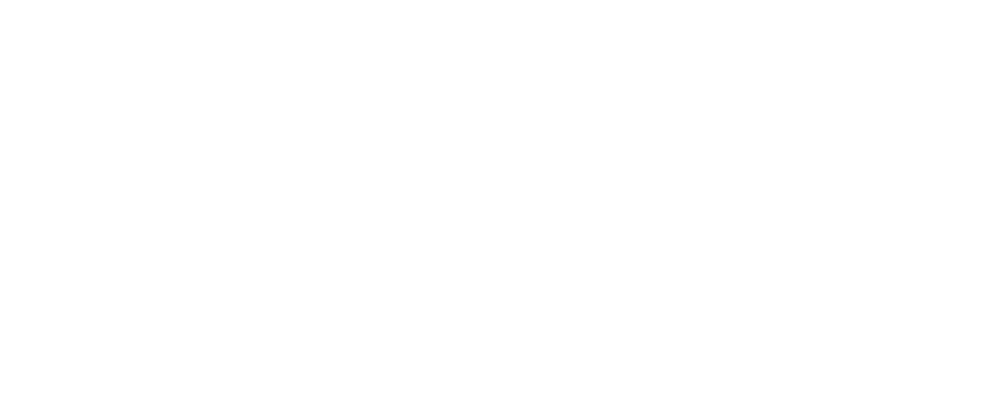

<IPython.core.display.Javascript object>


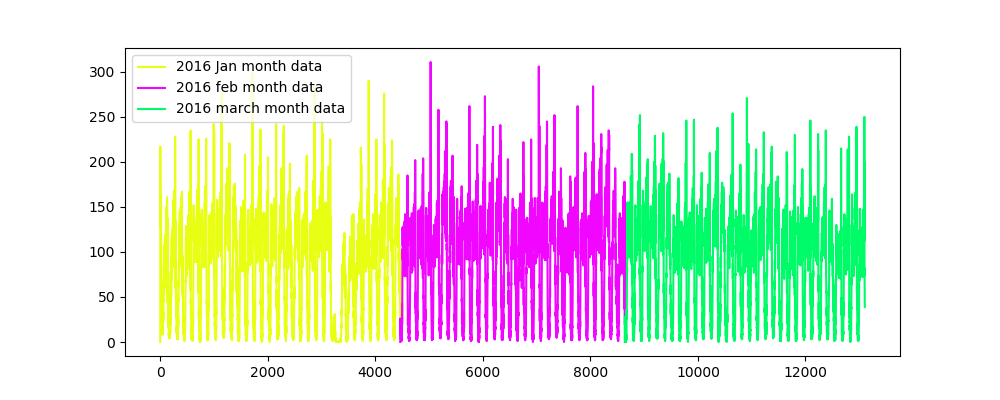

<IPython.core.display.Javascript object>


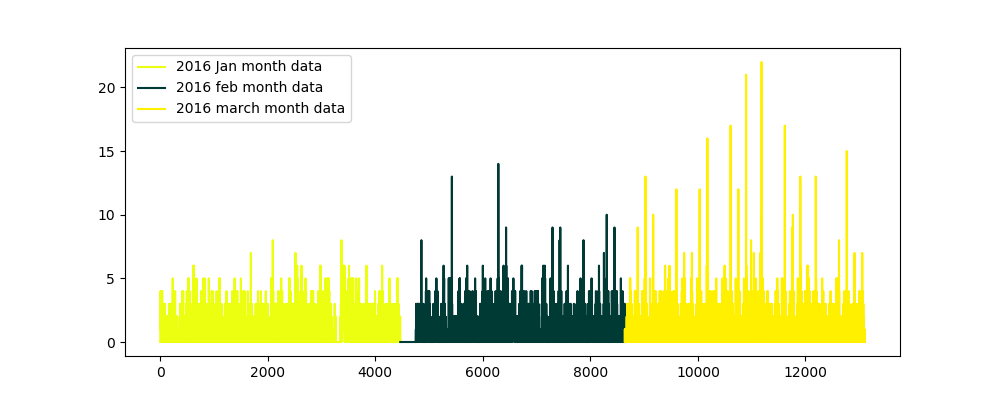

<IPython.core.display.Javascript object>


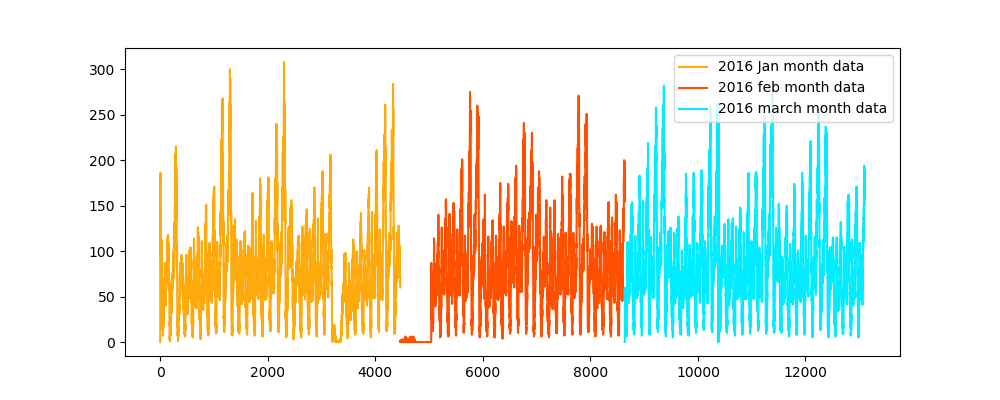

<IPython.core.display.Javascript object>


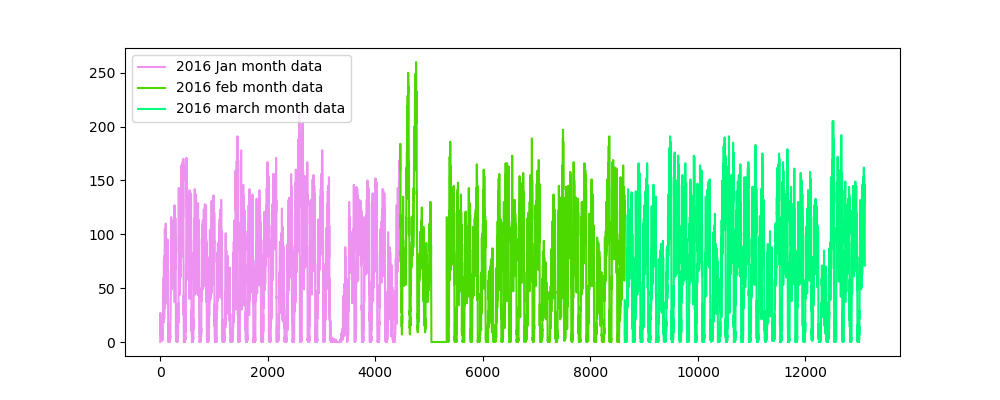

<IPython.core.display.Javascript object>


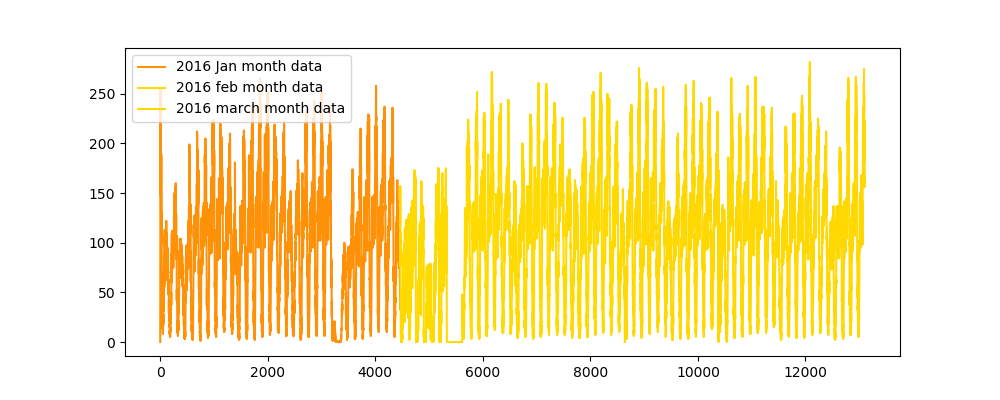

<IPython.core.display.Javascript object>


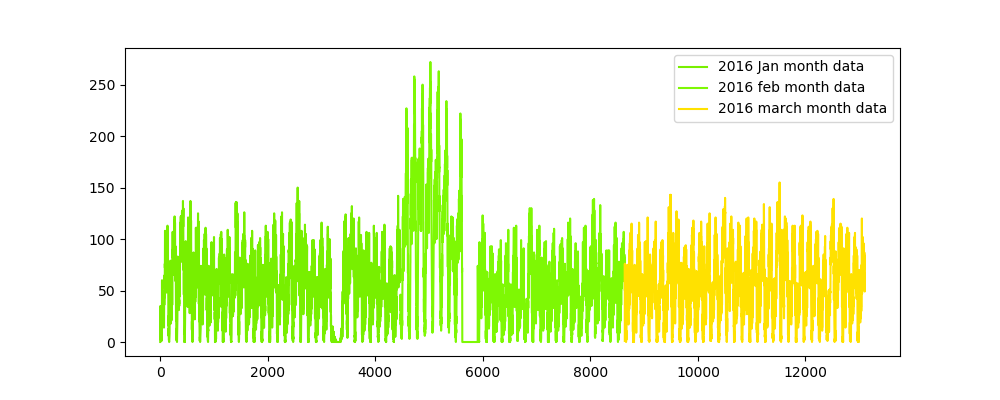

<IPython.core.display.Javascript object>


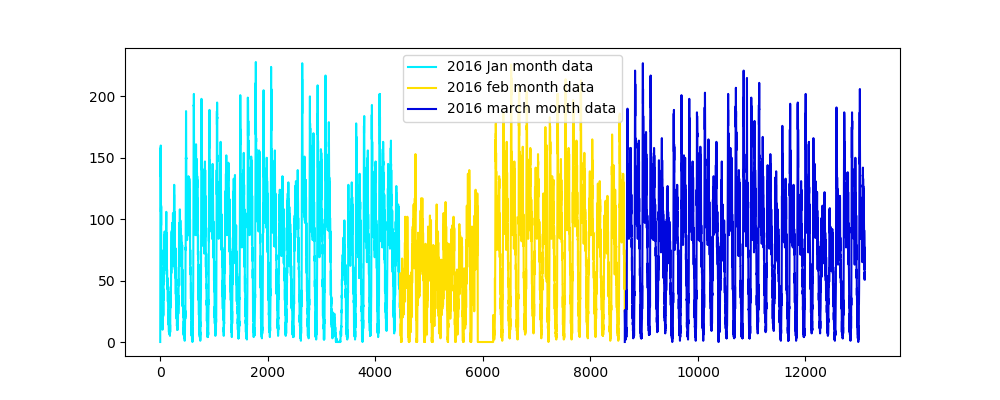

<IPython.core.display.Javascript object>


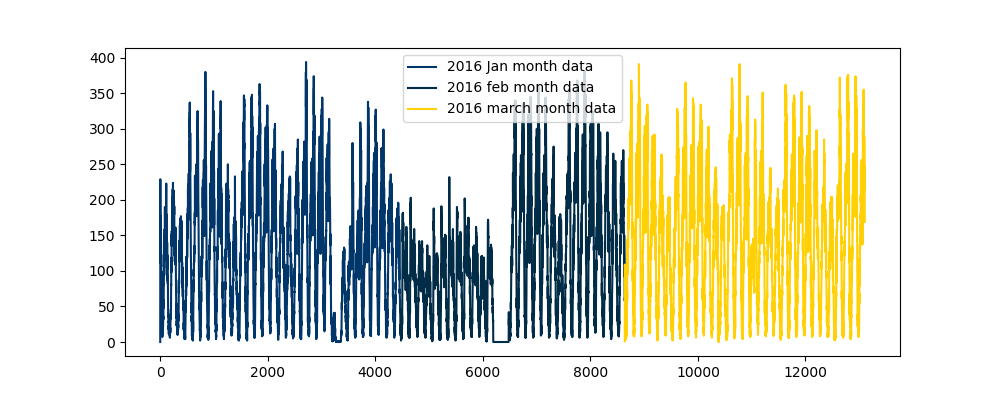

<IPython.core.display.Javascript object>


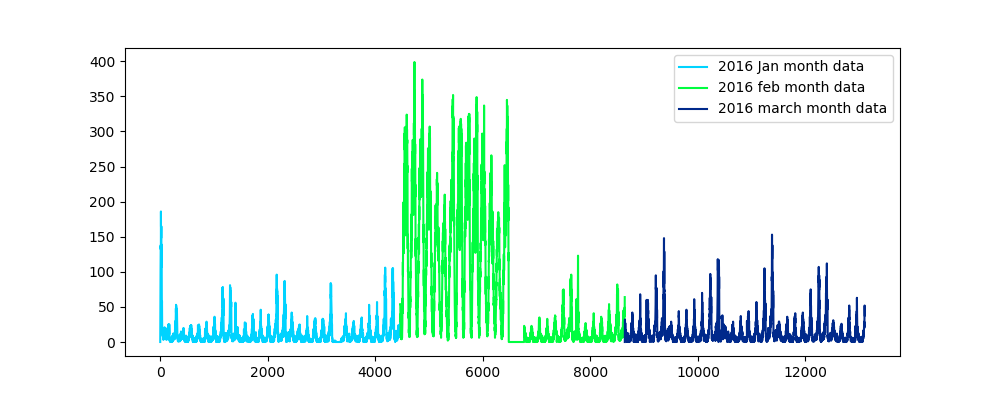

<IPython.core.display.Javascript object>


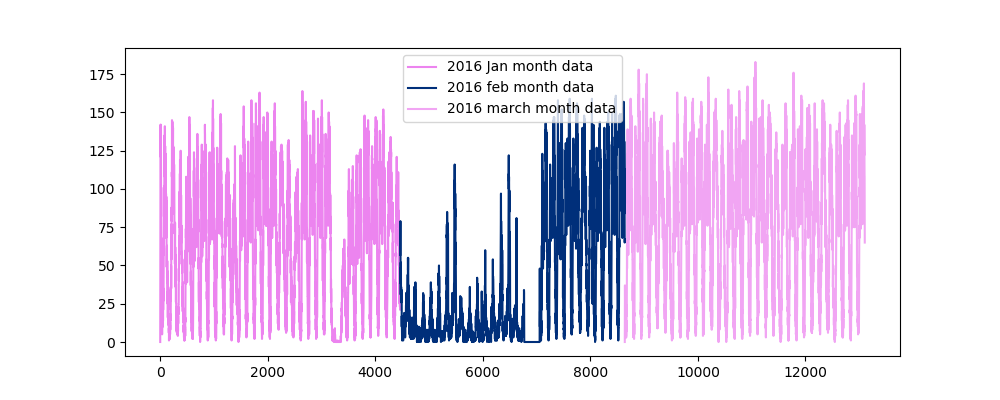

<IPython.core.display.Javascript object>


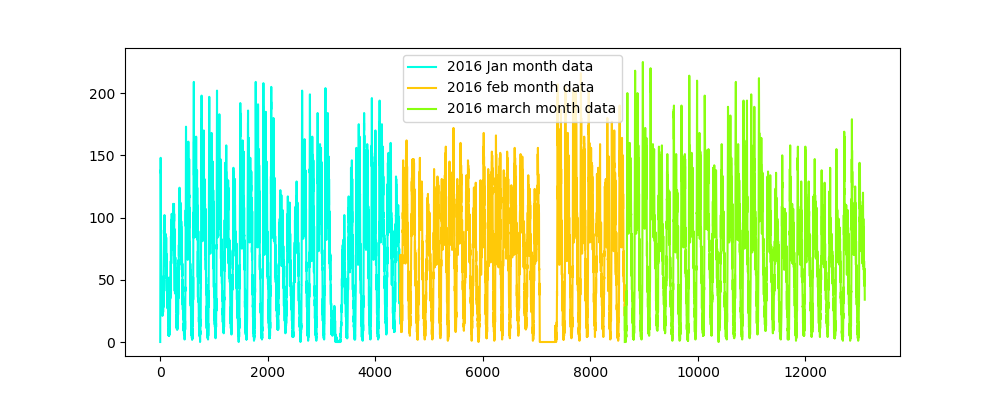

<IPython.core.display.Javascript object>


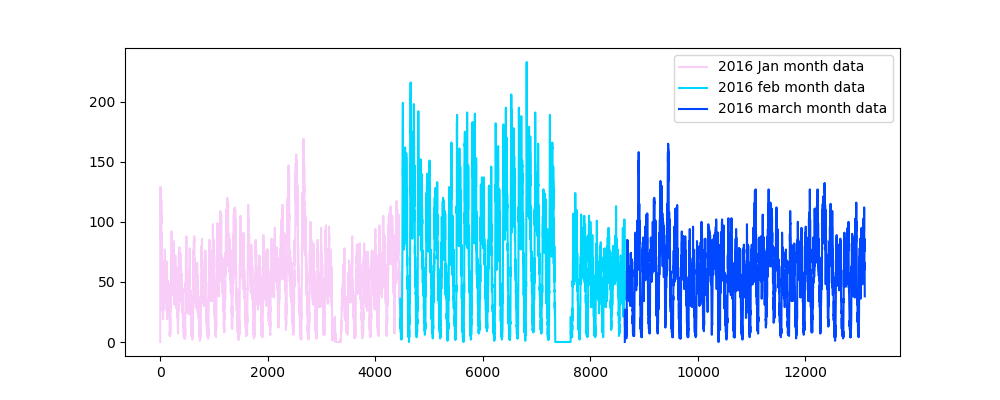

<IPython.core.display.Javascript object>


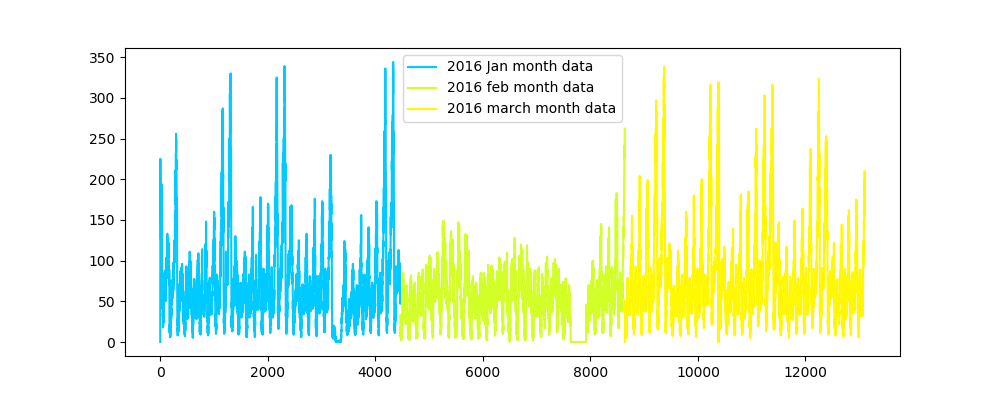

<IPython.core.display.Javascript object>


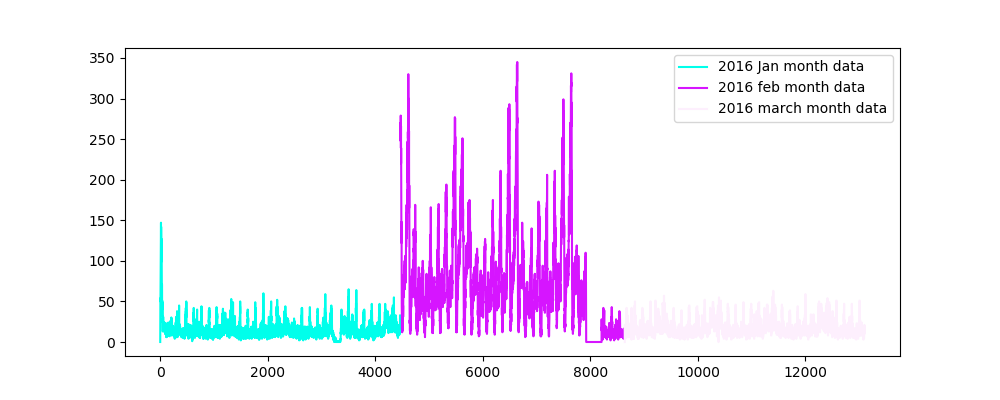

<IPython.core.display.Javascript object>


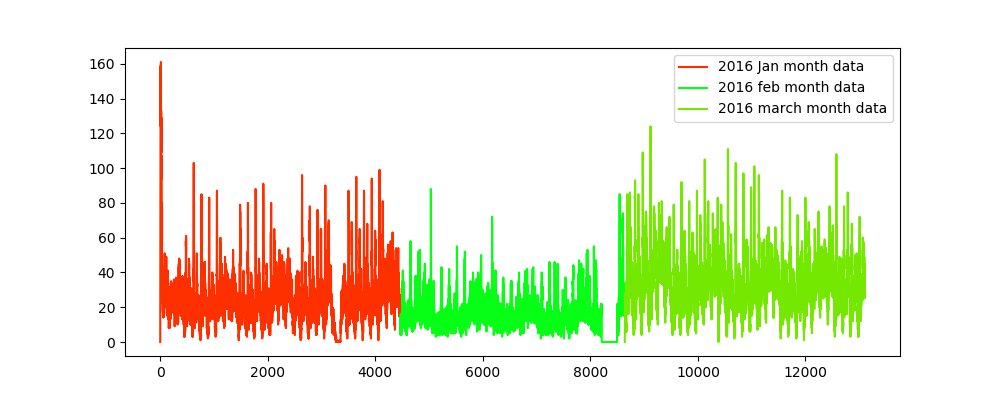

<IPython.core.display.Javascript object>


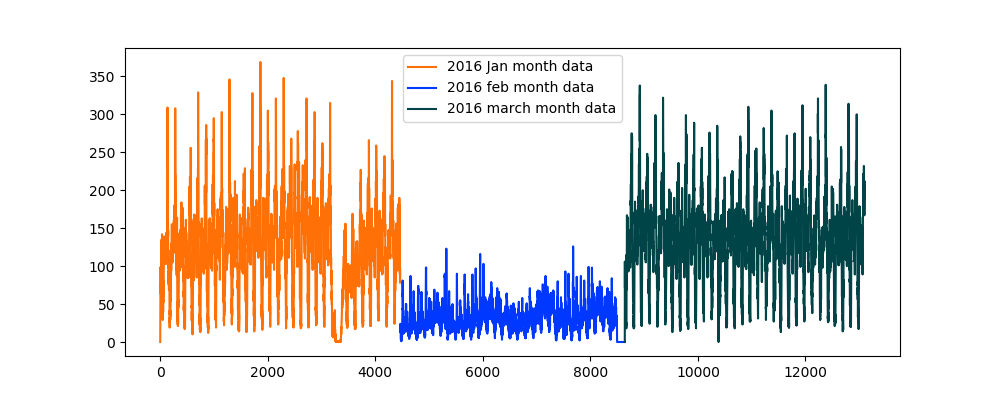

<IPython.core.display.Javascript object>


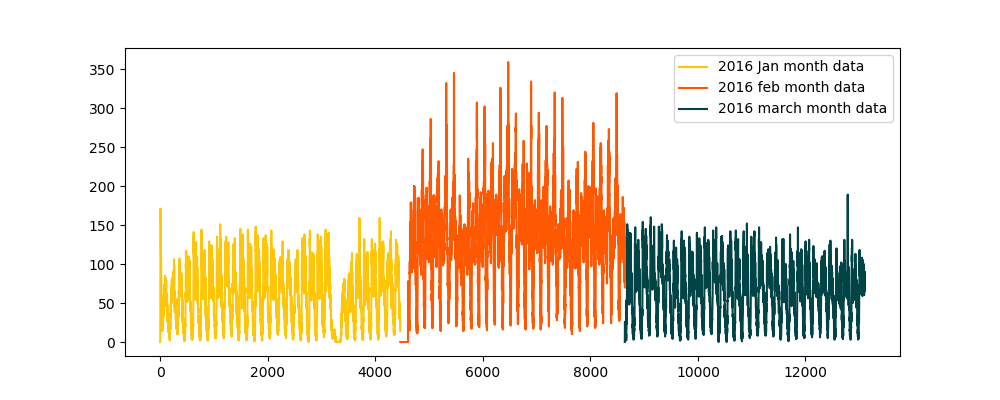

<IPython.core.display.Javascript object>


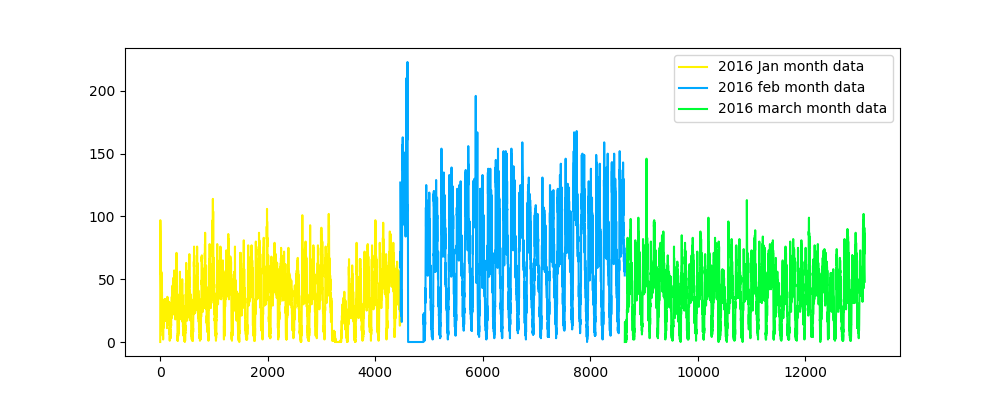

<IPython.core.display.Javascript object>


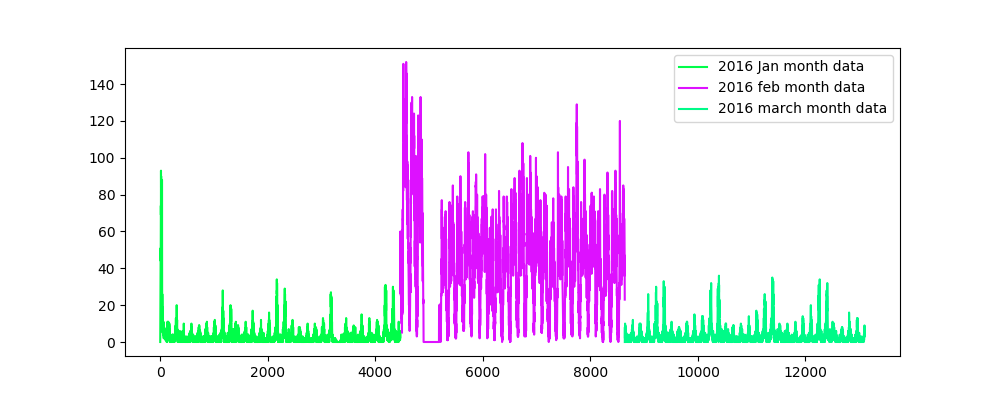

<IPython.core.display.Javascript object>


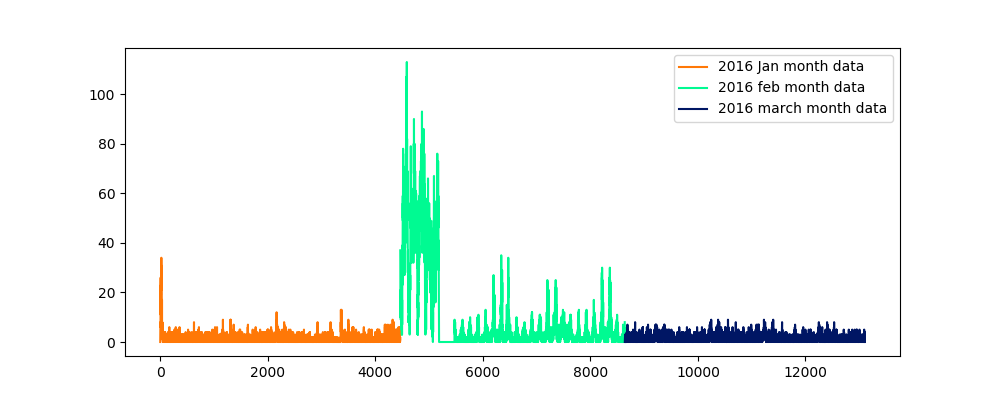

<IPython.core.display.Javascript object>


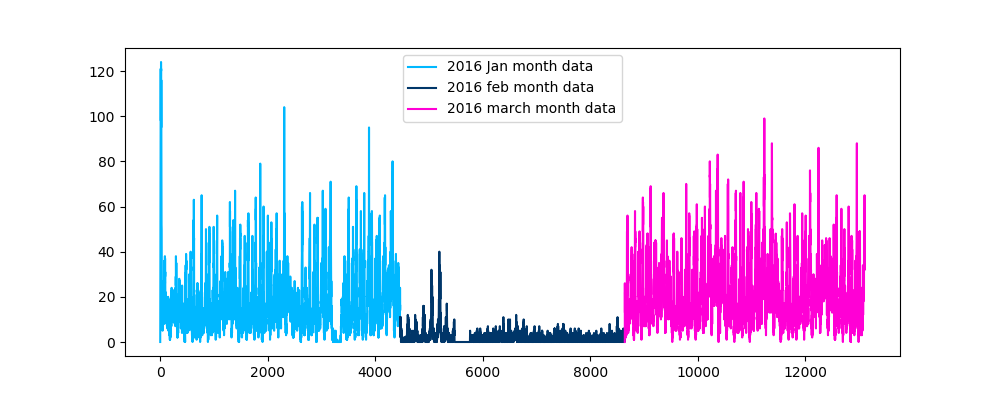

<IPython.core.display.Javascript object>


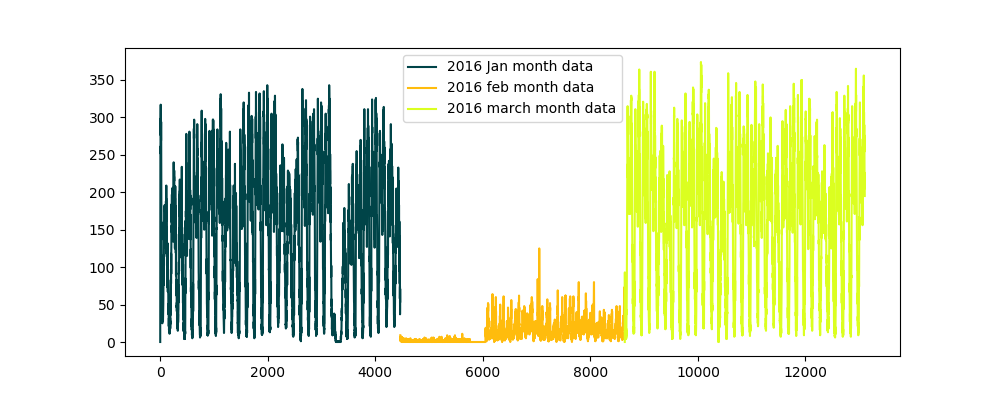

<IPython.core.display.Javascript object>


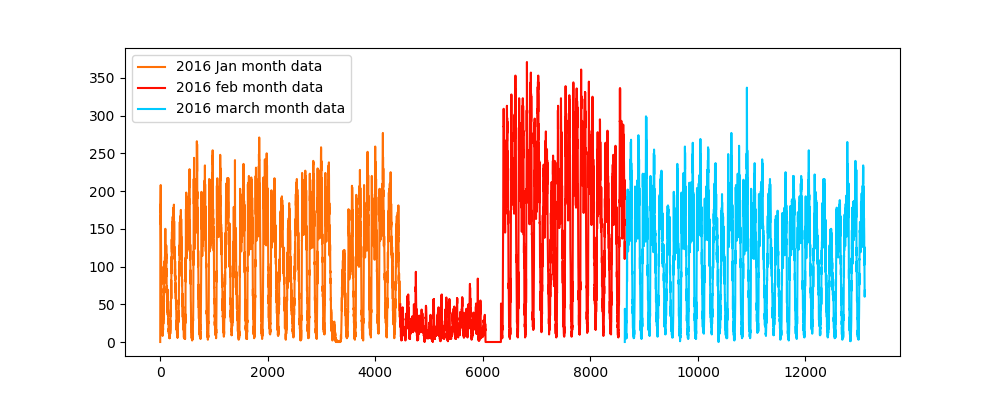

<IPython.core.display.Javascript object>


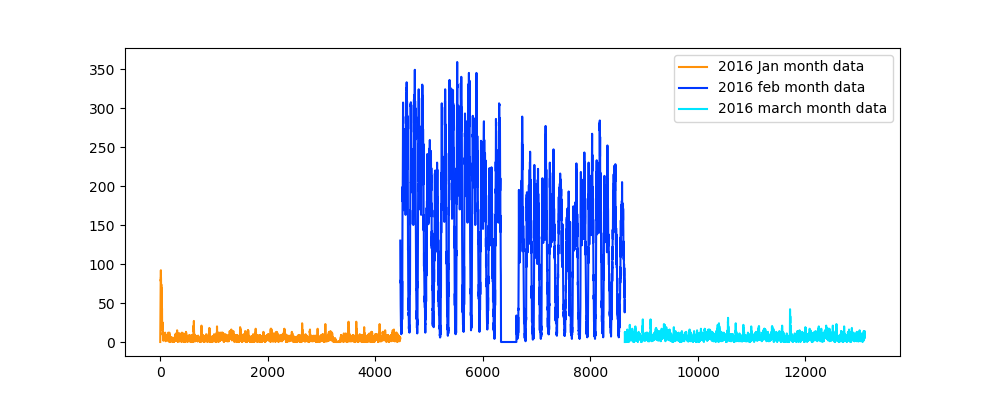

<IPython.core.display.Javascript object>


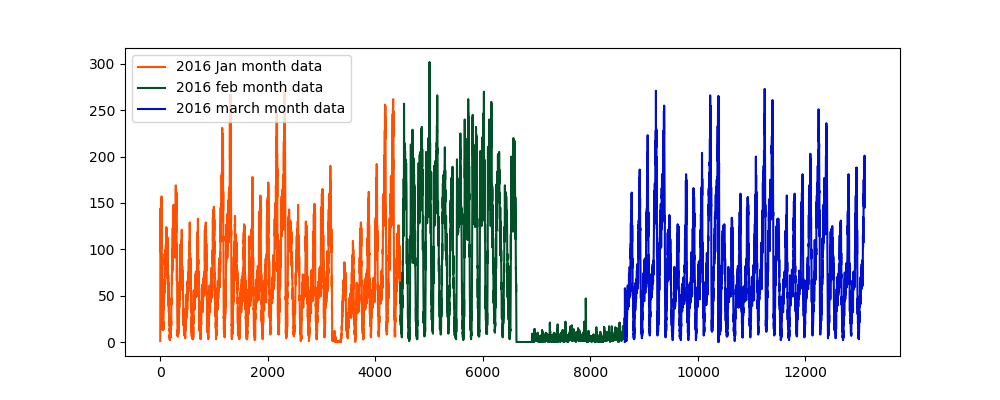

<IPython.core.display.Javascript object>


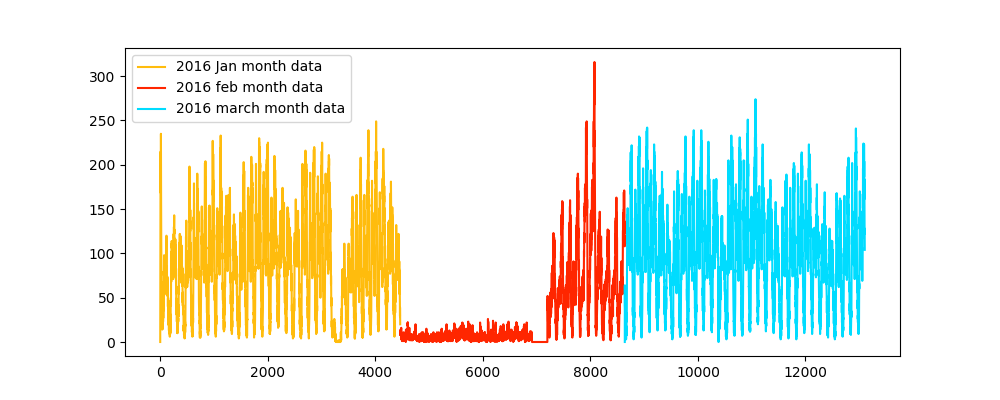

<IPython.core.display.Javascript object>


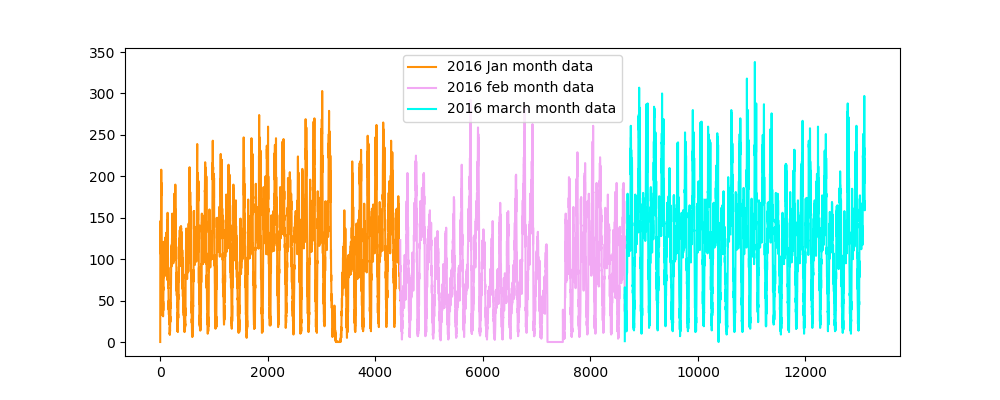

<IPython.core.display.Javascript object>


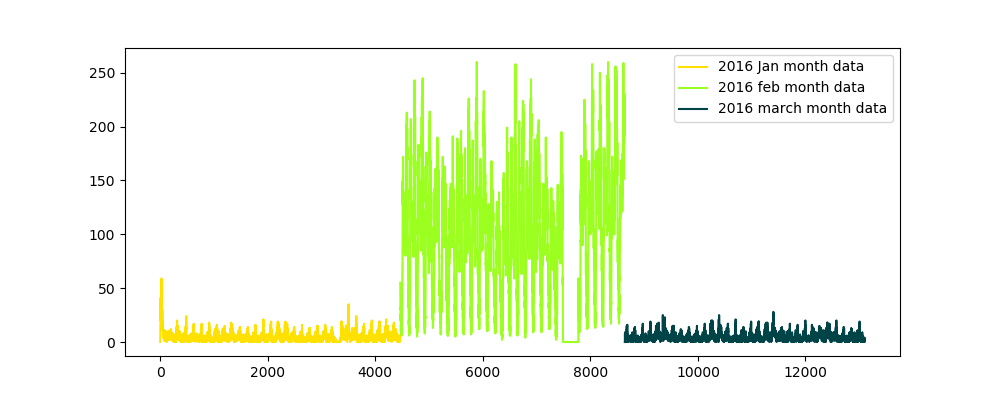

<IPython.core.display.Javascript object>


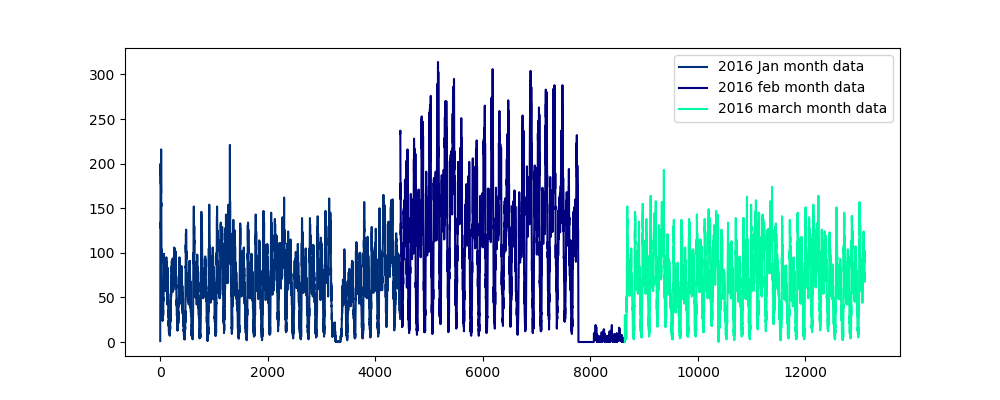

<IPython.core.display.Javascript object>


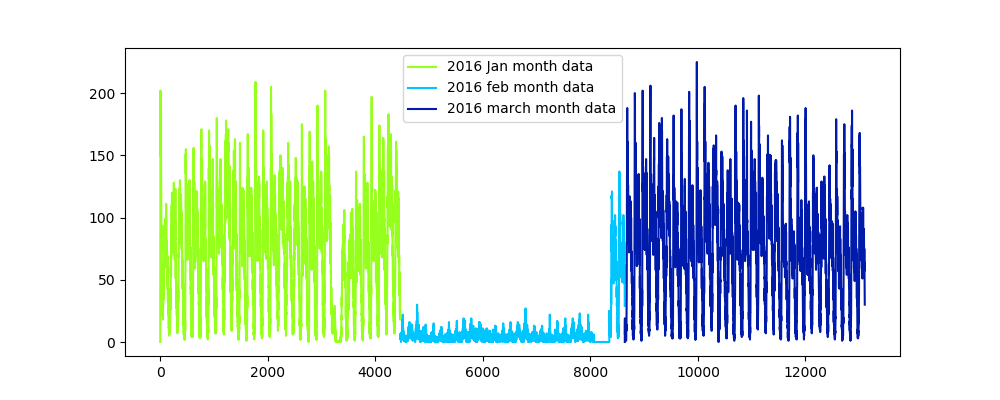

<IPython.core.display.Javascript object>


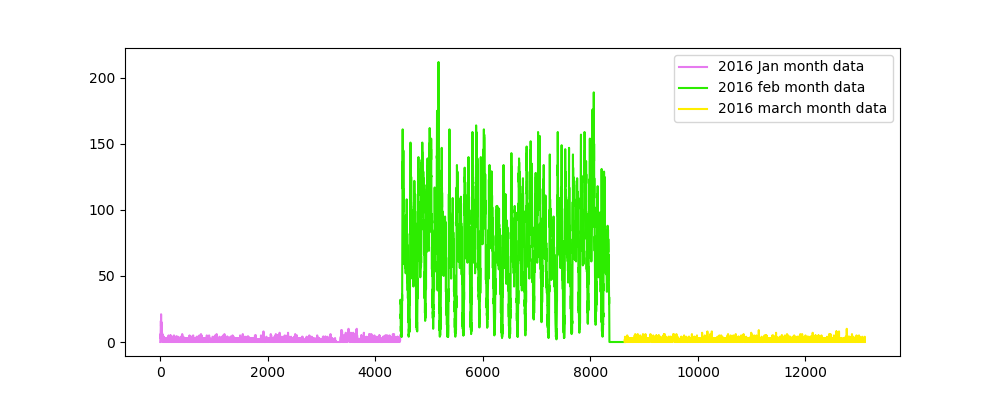

<IPython.core.display.Javascript object>


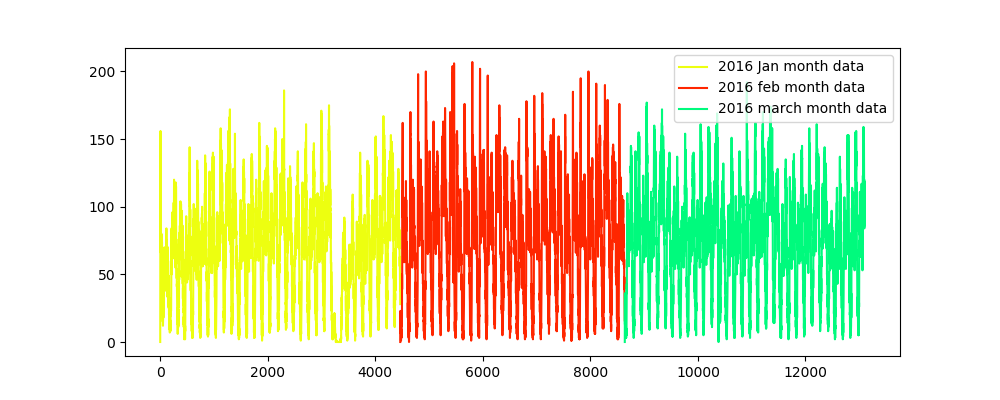

<IPython.core.display.Javascript object>


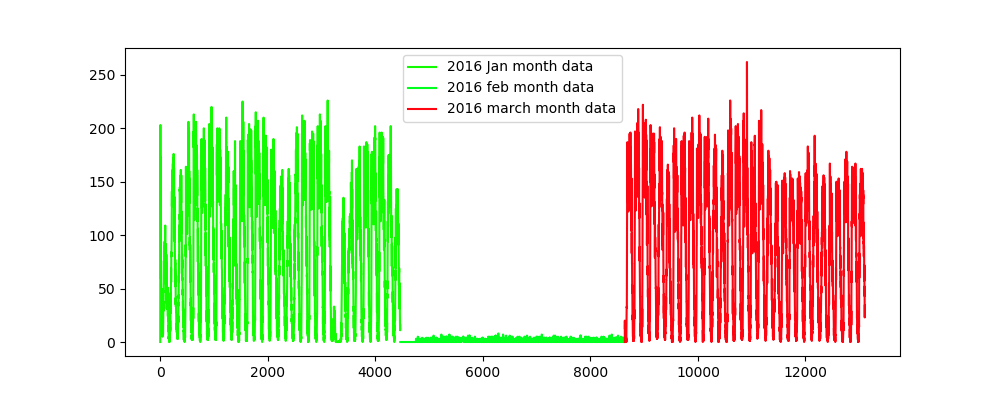

<IPython.core.display.Javascript object>


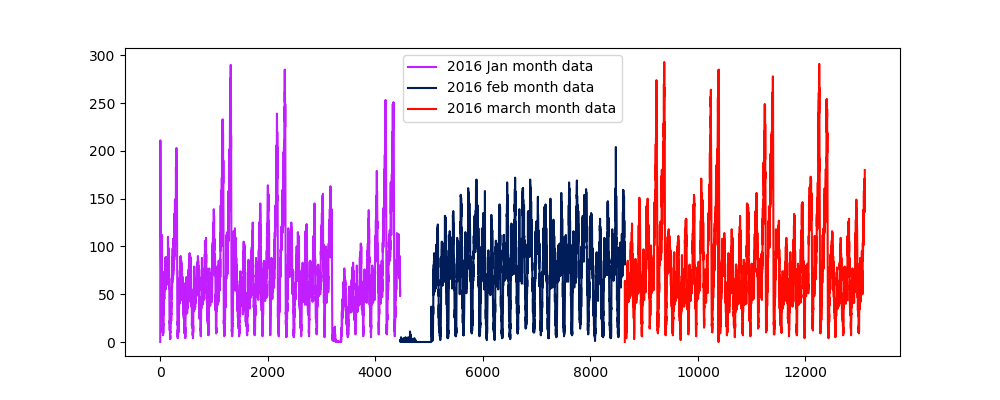

<IPython.core.display.Javascript object>


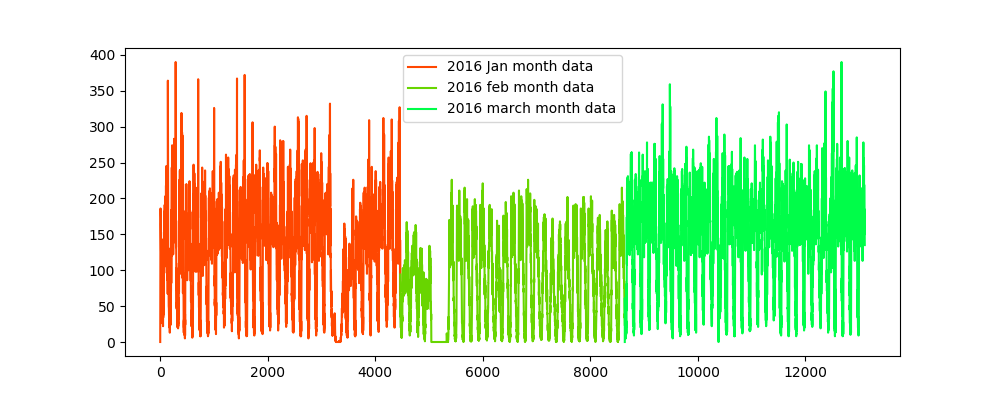

<IPython.core.display.Javascript object>


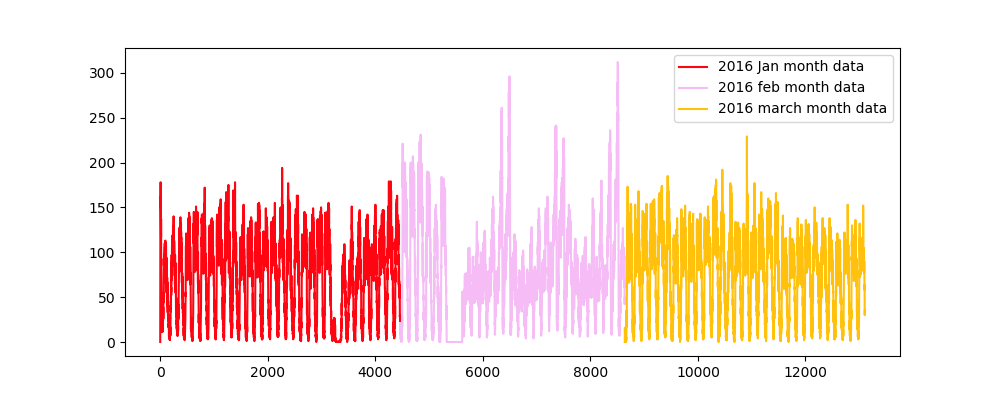

<IPython.core.display.Javascript object>


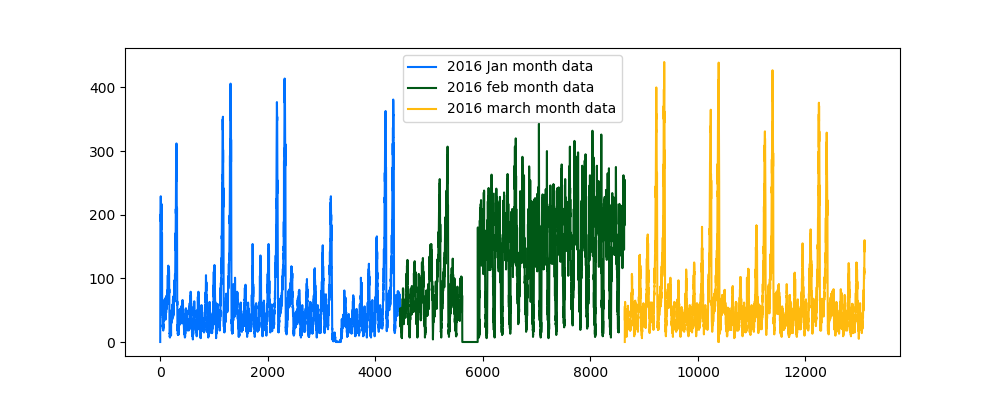

<IPython.core.display.Javascript object>


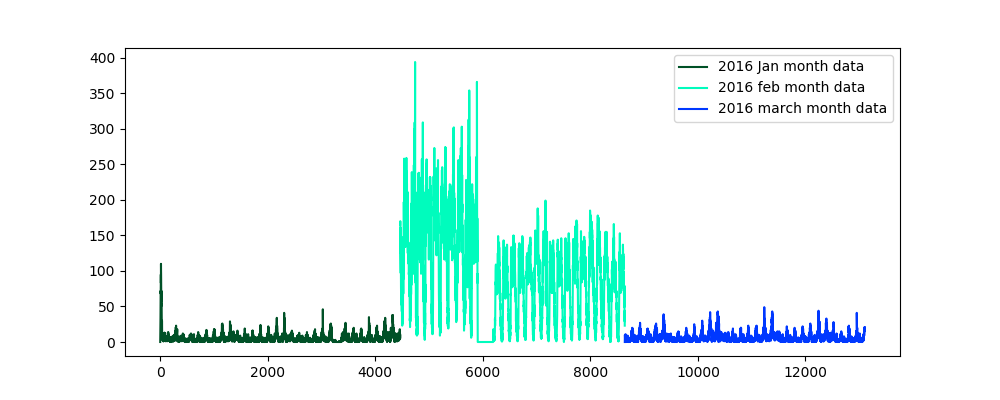

<IPython.core.display.Javascript object>


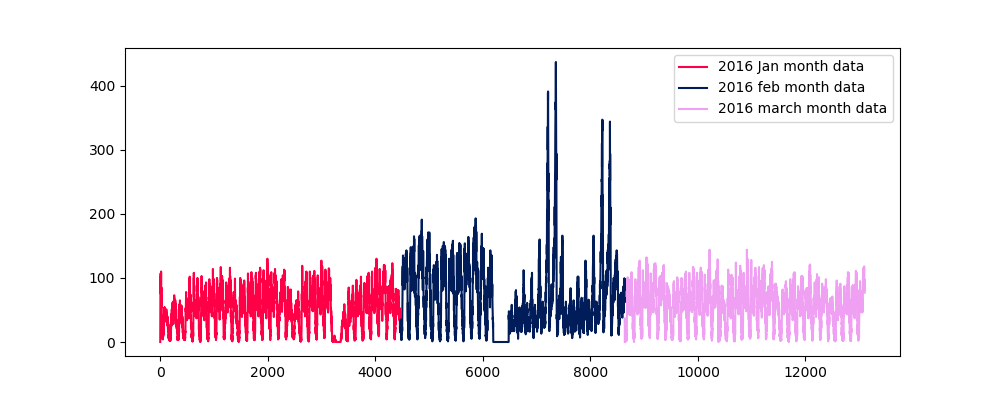

<IPython.core.display.Javascript object>


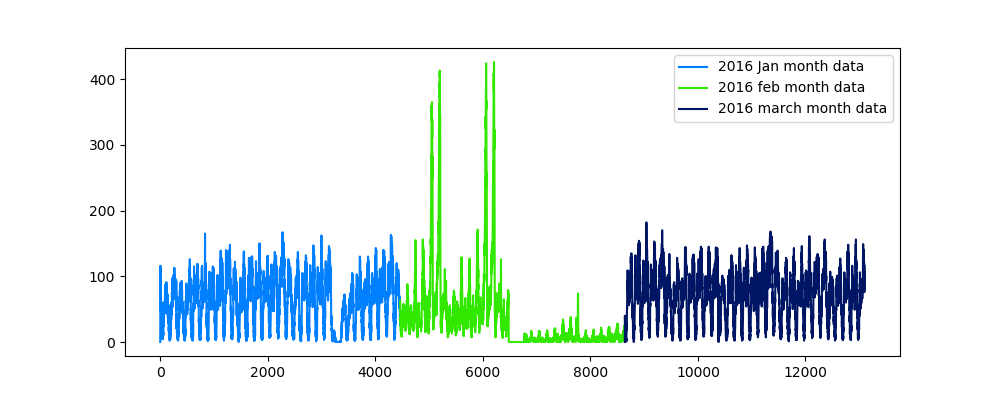

In [31]:
def uniqueish_color():
    """There're better ways to generate unique colors, but this isn't awful."""
    return plt.cm.gist_ncar(np.random.random())
first_x = list(range(0,4464))
second_x = list(range(4464,8640))
third_x = list(range(8640,13104))
for i in range(40):
    plt.figure(figsize=(10,4))
    plt.plot(first_x,regions_cum[i][:4464], color=uniqueish_color(), label='2016 Jan month data')
    plt.plot(second_x,regions_cum[i][4464:8640], color=uniqueish_color(), label='2016 feb month data')
    plt.plot(third_x,regions_cum[i][8640:], color=uniqueish_color(), label='2016 march month data')
    plt.legend()
    plt.show()

<IPython.core.display.Javascript object>


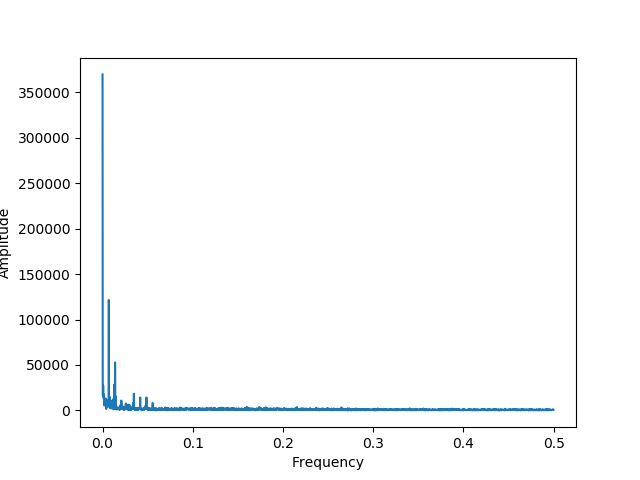

In [27]:
# getting peaks: https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
# read more about fft function : https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fft.html
Y    = np.fft.fft(np.array(jan_2016_smooth)[0:4460])
# read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
freq = np.fft.fftfreq(4460, 1)
n = len(freq)
plt.figure()
plt.plot( freq[:int(n/2)], np.abs(Y)[:int(n/2)] )
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

In [28]:
#Preparing the Dataframe only with x(i) values as jan-2015 data and y(i) values as jan-2016
ratios_jan = pd.DataFrame()
ratios_jan['Given']=jan_2015_smooth
ratios_jan['Prediction']=jan_2016_smooth
ratios_jan['Ratios']=ratios_jan['Prediction']*1.0/ratios_jan['Given']*1.0

### Modelling: Baseline Models

Now we get into modelling in order to forecast the pickup densities for the months of Jan, Feb and March of 2016 for which we are using multiple models with two variations 
1. Using Ratios of the 2016 data to the 2015 data i.e $\begin{align} R_{t} = P^{2016}_{t} / P^{2015}_{t} \end{align}$
2. Using Previous known values of the 2016 data itself to predict the future values 

#### Simple Moving Averages
The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value <br> 

Using Ratio Values - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$

In [29]:
def MA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    error=[]
    predicted_values=[]
    window_size=3
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_ratio=sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)])/window_size
        else:
            predicted_ratio=sum((ratios['Ratios'].values)[0:(i+1)])/(i+1)
            
    
    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

#### For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$ 

Next we use the Moving averages of the 2016  values itself to predict the future value using $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$

In [30]:
def MA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=1
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            predicted_value=int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)])/window_size)
        else:
            predicted_value=int(sum((ratios['Prediction'].values)[0:(i+1)])/(i+1))
            
    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

#### Weighted Moving Averages
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values - $\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

In [31]:
def WA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    window_size=5
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
            
    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

##### For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$ 

Weighted Moving Averages using Previous 2016 Values - $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$

In [32]:
def WA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=2
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)

        else:
            sum_values=0
            sum_of_coeff=0
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)
    
    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

#### Exponential  Weighted Moving Averages
 https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
Through weighted averaged we have satisfied the analogy of giving higher weights to the latest value and decreasing weights to the subsequent ones but we still do not know which is the correct weighting scheme as there are infinetly many possibilities in which we can assign weights in a non-increasing order and tune the the hyperparameter window-size. To simplify this process we use Exponential Moving Averages which is a more logical way towards assigning weights and at the same time also using an optimal window-size.

In exponential moving averages we use a single hyperparameter alpha $\begin{align}(\alpha)\end{align}$ which is a value between 0 & 1 and based on the value of the hyperparameter alpha the weights and the window sizes are configured.<br>
For eg. If $\begin{align}\alpha=0.9\end{align}$ then the number of days on which the value of the current iteration is based is~$\begin{align}1/(1-\alpha)=10\end{align}$ i.e. we consider values 10 days prior before we predict the value for the current iteration. Also the weights are assigned using $\begin{align}2/(N+1)=0.18\end{align}$ ,where N = number of prior values being considered, hence from this it is implied that the first or latest value is assigned a weight of 0.18 which keeps exponentially decreasing for the subsequent values.

$\begin{align}R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

In [33]:
def EA_R1_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.6
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])
    
    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

#### $\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ 

In [34]:
def EA_P1_Predictions(ratios,month):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha=0.3
    error=[]
    predicted_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))
    
    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [35]:
mean_err=[0]*10
median_err=[0]*10

startTime2 = datetime.datetime.now()

ratios_jan,mean_err[0],median_err[0]=MA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[1],median_err[1]=MA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[2],median_err[2]=WA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[3],median_err[3]=WA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[4],median_err[4]=EA_R1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[5],median_err[5]=EA_P1_Predictions(ratios_jan,'jan')

print("Time taken = "+str(datetime.datetime.now() - startTime2))

Time taken = 0:03:09.593516


#### Comparison between baseline models
We have chosen our error metric for comparison between models as <b>MAPE (Mean Absolute Percentage Error)</b> so that we can know that on an average how good is our model with predictions and <b>MSE (Mean Squared Error)</b> is also used so that we have a clearer understanding as to how well our forecasting model performs with outliers so that we make sure that there is not much of a error margin between our prediction and the actual value 

In [36]:
print ("Error Metric Matrix (Forecasting Methods) - MAPE & MSE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Moving Averages (Ratios) -                             MAPE: ",mean_err[0],"      MSE: ",median_err[0])
print ("Moving Averages (2016 Values) -                        MAPE: ",mean_err[1],"       MSE: ",median_err[1])
print ("--------------------------------------------------------------------------------------------------------")
print ("Weighted Moving Averages (Ratios) -                    MAPE: ",mean_err[2],"      MSE: ",median_err[2])
print ("Weighted Moving Averages (2016 Values) -               MAPE: ",mean_err[3],"      MSE: ",median_err[3])
print ("--------------------------------------------------------------------------------------------------------")
print ("Exponential Moving Averages (Ratios) -              MAPE: ",mean_err[4],"      MSE: ",median_err[4])
print ("Exponential Moving Averages (2016 Values) -         MAPE: ",mean_err[5],"      MSE: ",median_err[5])

Error Metric Matrix (Forecasting Methods) - MAPE & MSE
--------------------------------------------------------------------------------------------------------
Moving Averages (Ratios) -                             MAPE:  0.1821155173392136       MSE:  400.0625504032258
Moving Averages (2016 Values) -                        MAPE:  0.14292849686975506        MSE:  174.84901993727598
--------------------------------------------------------------------------------------------------------
Weighted Moving Averages (Ratios) -                    MAPE:  0.1784869254376018       MSE:  384.01578741039424
Weighted Moving Averages (2016 Values) -               MAPE:  0.13551088436182082       MSE:  162.46707549283155
--------------------------------------------------------------------------------------------------------
Exponential Moving Averages (Ratios) -              MAPE:  0.17783550194861494       MSE:  378.34610215053766
Exponential Moving Averages (2016 Values) -         MAPE:  0.135091526

## Regression Models 
### Train-Test Split
Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, ordered date-wise for every region

In [40]:
# Preparing data to be split into train and test, The below prepares data in cumulative form which will be later split into test and train
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 12960

# we take number of pickups that are happened in last 5 10min intravels
number_of_time_stamps = 5

# output varaible
# it is list of lists
# it will contain number of pickups 13099 for each cluster
output = []


# tsne_lat will contain 13104-5=13099 times lattitude of cluster center for every cluster
# Ex: [[cent_lat 13099times],[cent_lat 13099times], [cent_lat 13099times].... 40 lists]
# it is list of lists
tsne_lat = []


# tsne_lon will contain 13104-5=13099 times logitude of cluster center for every cluster
# Ex: [[cent_long 13099times],[cent_long 13099times], [cent_long 13099times].... 40 lists]
# it is list of lists
tsne_lon = []

# we will code each day 
# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
# for every cluster we will be adding 13099 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
tsne_weekday = []

# its an numbpy array, of shape (523960, 5)
# each row corresponds to an entry in out data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1th 10min intravel(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
tsne_feature = []


tsne_feature = [0]*number_of_time_stamps
for i in range(0,40):
    tsne_lat.append([kmeans.cluster_centers_[i][0]]*13099)
    tsne_lon.append([kmeans.cluster_centers_[i][1]]*13099)
    # jan 1st 2016 is thursday, so we start our day from 4: "(int(k/144))%7+4"
    # our prediction start from 5th 10min intravel since we need to have number of pickups that are happened in last 5 pickup bins
    tsne_weekday.append([int(((int(k/144))%7+4)%7) for k in range(5,4464+4176+4464)])
    # regions_cum is a list of lists [[x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], .. 40 lsits]
    tsne_feature = np.vstack((tsne_feature, [regions_cum[i][r:r+number_of_time_stamps] for r in range(0,len(regions_cum[i])-number_of_time_stamps)]))
    output.append(regions_cum[i][5:])
tsne_feature = tsne_feature[1:]

In [41]:
# Link: https://docs.scipy.org/doc/numpy-1.15.0/reference/routines.fft.html
# Link: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html

from numpy.fft import *
all_amp = list()
all_freq = list()

for loop1 in range(0,40):
    amp = np.abs(np.fft.fft(regions_cum[loop1]))
    freq = np.abs(np.fft.fftfreq(13104,1))
    
    amp_sorted = sorted(amp, reverse=True)   # sorting values in descending order
    freq_sorted = sorted(freq, reverse=True)
    
    amp_top_5 = amp_sorted[0:5]                     # selecting top 5 values
    freq_top_5 = freq_sorted[0:5]
    #print("amp_top_5 = ",amp_top_5)
    
    amp_list_top = list()
    freq_list_top = list()

    for loop2 in range(0,5):
        amp_list_top.append(amp_top_5[loop2])          #adding 5 top amp to a list whose index was stored
        freq_list_top.append(freq_top_5[loop2])  
    
    for loop3 in range(0,13099):
        all_amp.append(amp_list_top)
        all_freq.append(amp_list_top)

In [34]:
print(np.shape(regions_cum))
print(np.shape(amp))
print(type(amp))
#all_freq

(40, 13104)
(13104,)
<class 'numpy.ndarray'>


In [35]:
print(np.shape(all_amp))
print(np.shape(all_freq))

(523960, 5)
(523960, 5)


In [36]:
len(tsne_lat[0])*len(tsne_lat) == tsne_feature.shape[0] == len(tsne_weekday)*len(tsne_weekday[0]) == 40*13099 == len(output)*len(output[0])

True

In [42]:
# Getting the predictions of exponential moving averages to be used as a feature in cumulative form

# upto now we computed 8 features for every data point that starts from 50th min of the day
# 1. cluster center lattitude
# 2. cluster center longitude
# 3. day of the week 
# 4. f_t_1: number of pickups that are happened previous t-1th 10min intravel
# 5. f_t_2: number of pickups that are happened previous t-2th 10min intravel
# 6. f_t_3: number of pickups that are happened previous t-3th 10min intravel
# 7. f_t_4: number of pickups that are happened previous t-4th 10min intravel
# 8. f_t_5: number of pickups that are happened previous t-5th 10min intravel

# from the baseline models we said the exponential weighted moving avarage gives us the best error
# we will try to add the same exponential weighted moving avarage at t as a feature to our data
# exponential weighted moving avarage => p'(t) = alpha*p'(t-1) + (1-alpha)*P(t-1) 
alpha=0.3

# it is a temporary array that store exponential weighted moving avarage for each 10min intravel, 
# for each cluster it will get reset
# for every cluster it contains 13104 values
predicted_values=[]

# it is similar like tsne_lat
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lsits]
predict_list = []
tsne_flat_exp_avg = []
for r in range(0,40):
    for i in range(0,13104):
        if i==0:
            predicted_value= regions_cum[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(regions_cum[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

In [43]:
# train, test split : 70% 30% split
# Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data 
# and split it such that for every region we have 70% data in train and 30% in test,
# ordered date-wise for every region
print("size of train data :", int(13099*0.7))
print("size of test data :", int(13099*0.3))

size of train data : 9169
size of test data : 3929


In [44]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
train_features =  [tsne_feature[i*13099:(13099*i+9169)] for i in range(0,40)]
# temp = [0]*(12955 - 9068)
test_features = [tsne_feature[(13099*(i))+9169:13099*(i+1)] for i in range(0,40)]

In [45]:
print(np.shape(tsne_feature))
print(np.shape(all_amp))

(523960, 5)
(523960, 5)


In [46]:
print(np.shape(train_features))
print(np.shape(test_features))

(40, 9169, 5)
(40, 3930, 5)


In [47]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training and test data
train_amp = [all_amp[i*13099:(13099*i+9169)] for i in range(0,40)]
train_freq = [all_freq[i*13099:(13099*i+9169)] for i in range(0,40)]

test_amp = [all_amp[(13099*(i))+9169:13099*(i+1)] for i in range(0,40)]
test_freq = [all_freq[(13099*(i))+9169:13099*(i+1)] for i in range(0,40)]

In [48]:
print(np.shape(train_amp))
print(np.shape(train_freq))

(40, 9169, 5)
(40, 9169, 5)


In [44]:
print("Number of data clusters",len(train_features), "Number of data points in trian data", len(train_features[0]), "Each data point contains", len(train_features[0][0]),"features")
print("Number of data clusters",len(train_features), "Number of data points in test data", len(test_features[0]), "Each data point contains", len(test_features[0][0]),"features")

Number of data clusters 40 Number of data points in trian data 9169 Each data point contains 5 features
Number of data clusters 40 Number of data points in test data 3930 Each data point contains 5 features


In [97]:
# https://www.kaggle.com/abhishekkm/exercise-time-series-modeling/edit
# https://grisha.org/blog/2016/02/17/triple-exponential-smoothing-forecasting-part-iii/

def initial_trend(series, slen):
    sum = 0.0
    for i in range(slen):
        sum += float(series[i+slen] - series[i]) / slen
    return sum / slen

def initial_seasonal_components(series, slen):
    seasonals = {}
    season_averages = []
    n_seasons = int(len(series)/slen)
    # compute season averages
    for j in range(n_seasons):
        season_averages.append(sum(series[slen*j:slen*j+slen])/float(slen))
    # compute initial values
    for i in range(slen):
        sum_of_vals_over_avg = 0.0
        for j in range(n_seasons):
            sum_of_vals_over_avg += series[slen*j+i]-season_averages[j]
        seasonals[i] = sum_of_vals_over_avg/n_seasons
    return seasonals


def triple_exponential_smoothing(series, slen, alpha, beta, gamma, n_preds):
    result = []
    seasonals = initial_seasonal_components(series, slen)
    for i in range(len(series)+n_preds):
        if i == 0: # initial values
            smooth = series[0]
            trend = initial_trend(series, slen)
            result.append(series[0])
            continue
        if i >= len(series): # we are forecasting
            m = i - len(series) + 1
            result.append((smooth + m*trend) + seasonals[i%slen])
        else:
            val = series[i]
            last_smooth, smooth = smooth, alpha*(val-seasonals[i%slen]) + (1-alpha)*(smooth+trend)
            trend = beta * (smooth-last_smooth) + (1-beta)*trend
            seasonals[i%slen] = gamma*(val-smooth) + (1-gamma)*seasonals[i%slen]
            result.append(smooth+trend+seasonals[i%slen])
    return result


startTime3 = datetime.datetime.now()
print("Current time is: ",startTime3)

alpha = 0.716
beta = 0.029 
gamma = 0.993
season_len = 12

predict_values_3ex =[]
predict_values_3ex_list = []
tsne_flat_exp_avg_2 = []
for r in range(0,40):
    predict_values_3ex = triple_exponential_smoothing(regions_cum[r][0:13104], season_len, alpha, beta, gamma, 0)
    predict_values_3ex_list.append(predict_values_3ex[5:])
    
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))

Current time is:  2019-03-17 15:06:36.170642
Time taken for creation of dataframe is 0:00:47.483442


In [49]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
tsne_train_flat_lat = [i[:9169] for i in tsne_lat]
tsne_train_flat_lon = [i[:9169] for i in tsne_lon]
tsne_train_flat_weekday = [i[:9169] for i in tsne_weekday]
tsne_train_flat_output = [i[:9169] for i in output]
tsne_train_flat_exp_avg = [i[:9169] for i in predict_list]
#tsne_train_flat_3ex = [i[:9169] for i in predict_values_3ex_list]

In [50]:
# extracting the rest of the timestamp values i.e 30% of 12956 (total timestamps) for our test data
tsne_test_flat_lat = [i[9169:] for i in tsne_lat]
tsne_test_flat_lon = [i[9169:] for i in tsne_lon]
tsne_test_flat_weekday = [i[9169:] for i in tsne_weekday]
tsne_test_flat_output = [i[9169:] for i in output]
tsne_test_flat_exp_avg = [i[9169:] for i in predict_list]
#tsne_test_flat_3ex = [i[9169:] for i in predict_values_3ex_list]

In [51]:
# the above contains values in the form of list of lists (i.e. list of values of each region), here we make all of them in one list
train_new_features = []
for i in range(0,40):
    train_new_features.extend(train_features[i])
test_new_features = []
for i in range(0,40):
    test_new_features.extend(test_features[i])
    
amp_new_features_train = []
for i in range(0,40):
    amp_new_features_train.extend(train_amp[i])
freq_new_features_train = []
for i in range(0,40):
    freq_new_features_train.extend(train_freq[i])
    
amp_new_features_test = []
for i in range(0,40):
    amp_new_features_test.extend(test_amp[i])
freq_new_features_test = []
for i in range(0,40):
    freq_new_features_test.extend(test_freq[i])

In [52]:
train_final = np.hstack((train_new_features, amp_new_features_train, freq_new_features_train))
test_final = np.hstack((test_new_features, amp_new_features_test, freq_new_features_test))

In [53]:
print(np.shape(amp_new_features_train))

(366760, 5)


In [54]:
print(np.shape(freq_new_features_train))

(366760, 5)


In [55]:
# converting lists of lists into sinle list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_train_lat = sum(tsne_train_flat_lat, [])
tsne_train_lon = sum(tsne_train_flat_lon, [])
tsne_train_weekday = sum(tsne_train_flat_weekday, [])
tsne_train_output = sum(tsne_train_flat_output, [])
tsne_train_exp_avg = sum(tsne_train_flat_exp_avg,[])
tsne_train_3ex = sum(tsne_train_flat_3ex,[])

In [56]:
print(np.shape(tsne_train_output))

(366760,)


In [57]:
# converting lists of lists into sinle list i.e flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_test_lat = sum(tsne_test_flat_lat, [])
tsne_test_lon = sum(tsne_test_flat_lon, [])
tsne_test_weekday = sum(tsne_test_flat_weekday, [])
tsne_test_output = sum(tsne_test_flat_output, [])
tsne_test_exp_avg = sum(tsne_test_flat_exp_avg,[])
tsne_test_3ex = sum(tsne_test_flat_3ex,[])

In [58]:
# Preparing the data frame for our train data
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1','ft_amp1','ft_amp2','ft_amp3','ft_amp4','ft_amp5','ft_freq1','ft_freq2','ft_freq3','ft_freq4','ft_freq5']
df_train = pd.DataFrame(data=train_final, columns=columns) 
df_train['lat'] = tsne_train_lat
df_train['lon'] = tsne_train_lon
df_train['weekday'] = tsne_train_weekday
df_train['exp_avg'] = tsne_train_exp_avg
df_train['3_EXP'] = tsne_train_3ex

print(df_train.shape)

(366760, 19)


In [59]:
# Preparing the data frame for our test data
df_test = pd.DataFrame(data=test_final, columns=columns) 
df_test['lat'] = tsne_test_lat
df_test['lon'] = tsne_test_lon
df_test['weekday'] = tsne_test_weekday
df_test['exp_avg'] = tsne_test_exp_avg
df_test['3_EXP'] = tsne_test_3ex

print(df_test.shape)

(157200, 19)


In [60]:
#Saving the file                              ***** DO NOT RUN *****
import joblib
joblib.dump(df_train,"df_train.pkl")
joblib.dump(df_test,"df_test.pkl")

['df_test.pkl']

In [61]:
df_train = joblib.load("df_train.pkl")
df_test = joblib.load("df_test.pkl")

In [112]:
df_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,ft_amp1,ft_amp2,ft_amp3,ft_amp4,ft_amp5,ft_freq1,ft_freq2,ft_freq3,ft_freq4,ft_freq5,lat,lon,weekday,exp_avg,3_EXP
0,0.0,63.0,217.0,189.0,137.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,150,136.710167
1,63.0,217.0,189.0,137.0,135.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,139,130.396060
2,217.0,189.0,137.0,135.0,129.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,132,151.663547
3,189.0,137.0,135.0,129.0,150.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,144,166.031390
4,137.0,135.0,129.0,150.0,164.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,158,153.874255


In [113]:
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,ft_amp1,ft_amp2,ft_amp3,ft_amp4,ft_amp5,ft_freq1,ft_freq2,ft_freq3,ft_freq4,ft_freq5,lat,lon,weekday,exp_avg,3_EXP
0,118.0,106.0,104.0,93.0,102.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,100,100.817048
1,106.0,104.0,93.0,102.0,101.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,100,120.130539
2,104.0,93.0,102.0,101.0,120.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,114,131.262395
3,93.0,102.0,101.0,120.0,131.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,125,165.024596
4,102.0,101.0,120.0,131.0,164.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,152,155.329939


In [114]:
from sklearn.preprocessing import StandardScaler
#standardizing the data
df_train_std = StandardScaler().fit_transform(df_train)
df_test_std = StandardScaler().fit_transform(df_test)

#Saving the file                        
import joblib
joblib.dump(df_train_std,"df_train_std.pkl")
joblib.dump(df_test_std,"df_test_std.pkl")
joblib.dump(tsne_train_output,"tsne_train_output.pkl")
joblib.dump(tsne_test_output,"tsne_test_output.pkl")

['tsne_test_output.pkl']

In [2]:
import joblib
df_train_std = joblib.load("df_train_std.pkl")
df_test_std = joblib.load("df_test_std.pkl")
tsne_train_output = joblib.load("tsne_train_output.pkl")
tsne_test_output = joblib.load("tsne_test_output.pkl")

### Linear Regression 

In [95]:
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html
# -------------------------
# default paramters
# sklearn.linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)

# some of methods of LinearRegression()
# fit(X, y[, sample_weight])	Fit linear model.
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict using the linear model
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# set_params(**params)	Set the parameters of this estimator.
# -----------------------
# video link: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/geometric-intuition-1-2-copy-8/
# -----------------------

from sklearn.linear_model import LinearRegression
lr_reg=LinearRegression().fit(df_train, tsne_train_output)

y_pred = lr_reg.predict(df_test)
lr_test_predictions = [round(value) for value in y_pred]
y_pred = lr_reg.predict(df_train)
lr_train_predictions = [round(value) for value in y_pred]

In [3]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
#hyper-paramater tuning
startTime3 = datetime.datetime.now()
print("Current Time = ",startTime3)

#Using GridSearchCV with L2 Regularizer
tuned_parameters = [{'alpha': [10**-4, 10**-2, 10**0, 10**2]}]
clf_sgd = linear_model.SGDRegressor()
model_l2 = GridSearchCV(clf_sgd,param_grid=tuned_parameters, cv=3)
model_l2.fit(df_train_std, tsne_train_output)

GS_OPTIMAL_clf_sgd = model_l2.best_estimator_
print("GS_OPTIMAL_clf_sgd = ",GS_OPTIMAL_clf_sgd)
best_score_model_l2 = model_l2.best_score_
print("\nBest score: ",best_score_model_l2)
test_score_l2 = model_l2.score(df_test_std, tsne_test_output)
print("test_score_l2 = ",test_score_l2)
alpha = model_l2.best_params_["alpha"]
print("Best alpha= ",alpha)

#applying linear regression with best hyper-parameter
best_model_l2 = linear_model.SGDRegressor(alpha = alpha)
best_model_l2.fit(df_train_std, tsne_train_output)

train_pred = best_model_l2.predict(df_train_std)
train_MAPE = mean_absolute_error(tsne_train_output, train_pred)/ (sum(tsne_train_output)/len(tsne_train_output))
                                                                                             
test_pred = best_model_l2.predict(df_test_std)
test_MAPE = mean_absolute_error(tsne_test_output, test_pred)/ (sum(tsne_test_output)/len(tsne_test_output))

print("train_MAPE = ",train_MAPE)
print("test_MAPE = ",test_MAPE)

startTime = datetime.datetime.now()
print("Current Time = ",startTime)
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))

Current Time =  2019-03-18 16:49:00.031347
GS_OPTIMAL_clf_sgd =  SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
       eta0=0.01, fit_intercept=True, l1_ratio=0.15,
       learning_rate='invscaling', loss='squared_loss', max_iter=None,
       n_iter=None, n_iter_no_change=5, penalty='l2', power_t=0.25,
       random_state=None, shuffle=True, tol=None, validation_fraction=0.1,
       verbose=0, warm_start=False)

Best score:  0.9998692609151741
test_score_l2 =  0.993335640089834
Best alpha=  0.0001
train_MAPE =  0.008520747229558968
test_MAPE =  0.07651317333465396
Current Time =  2019-03-18 16:49:32.198531
Time taken for creation of dataframe is 0:00:32.167184


In [65]:
import tqdm
import time

for i in tqdm.tqdm(range(10)):
    time.sleep(1.01)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:10<00:00,  1.01s/it]


### Random Forest Regressor

In [100]:
# Training a hyper-parameter tuned random forest regressor on our train data
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
# -------------------------
# default paramters
# sklearn.ensemble.RandomForestRegressor(n_estimators=10, criterion=’mse’, max_depth=None, min_samples_split=2, 
# min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=’auto’, max_leaf_nodes=None, min_impurity_decrease=0.0, 
# min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=1, random_state=None, verbose=0, warm_start=False)

# some of methods of RandomForestRegressor()
# apply(X)	Apply trees in the forest to X, return leaf indices.
# decision_path(X)	Return the decision path in the forest
# fit(X, y[, sample_weight])	Build a forest of trees from the training set (X, y).
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict regression target for X.
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------

regr1 = RandomForestRegressor(max_features='sqrt',min_samples_leaf=4,min_samples_split=3,n_estimators=40, n_jobs=-1)
regr1.fit(df_train, tsne_train_output)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=4, min_samples_split=3,
           min_weight_fraction_leaf=0.0, n_estimators=40, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [101]:
# Predicting on test data using our trained random forest model 

# the models regr1 is already hyper parameter tuned
# the parameters that we got above are found using grid search

y_pred = regr1.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]

In [ ]:
#feature importances based on analysis using random forest
print (df_train.columns)
print (regr1.feature_importances_)

In [66]:
import tqdm
import time

for i in tqdm.tqdm(range(1000)):
    time.sleep(0.01)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:10<00:00, 91.58it/s]


In [120]:
#hyper-paramater tuning
from sklearn.model_selection import GridSearchCV
startTime7 = datetime.datetime.now
print("Current time = ", startTime7)

values = [10, 40, 80, 150, 600]
clf = RandomForestRegressor()
hyper_parameter = {"n_estimators": values}
    
best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
best_parameter.fit(df_train_std, tsne_train_output)
    
estimators = best_parameter.best_params_["n_estimators"]

#applying random forest with best hyper-parameter
clf = RandomForestRegressor(n_estimators = estimators)
clf.fit(df_train_std, tsne_train_output)

In [121]:
train_pred = clf.predict(df_train_std)
train_MAPE_ranf = mean_absolute_error(tsne_train_output, train_pred)/ (sum(tsne_train_output)/len(tsne_train_output))
train_MSE = mean_squared_error(tsne_train_output, train_pred)

test_pred = clf.predict(df_test_std)
test_MAPE_ranf = mean_absolute_error(tsne_test_output, test_pred)/ (sum(tsne_test_output)/len(tsne_test_output))
test_MSE = mean_squared_error(tsne_test_output, test_pred)

print(train_MAPE_ranf)
print(test_MAPE_ranf)

0.0021194316693986153
0.06950640604153843


### XgBoost Regressor 

In [107]:
# Training a hyper-parameter tuned Xg-Boost regressor on our train data

# find more about XGBRegressor function here http://xgboost.readthedocs.io/en/latest/python/python_api.html?#module-xgboost.sklearn
# -------------------------
# default paramters
# xgboost.XGBRegressor(max_depth=3, learning_rate=0.1, n_estimators=100, silent=True, objective='reg:linear', 
# booster='gbtree', n_jobs=1, nthread=None, gamma=0, min_child_weight=1, max_delta_step=0, subsample=1, colsample_bytree=1, 
# colsample_bylevel=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1, base_score=0.5, random_state=0, seed=None, 
# missing=None, **kwargs)

# some of methods of RandomForestRegressor()
# fit(X, y, sample_weight=None, eval_set=None, eval_metric=None, early_stopping_rounds=None, verbose=True, xgb_model=None)
# get_params([deep])	Get parameters for this estimator.
# predict(data, output_margin=False, ntree_limit=0) : Predict with data. NOTE: This function is not thread safe.
# get_score(importance_type='weight') -> get the feature importance
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------

x_model = xgb.XGBRegressor(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=3,
 min_child_weight=3,
 gamma=0,
 subsample=0.8,
 reg_alpha=200, reg_lambda=200,
 colsample_bytree=0.8,nthread=4)
x_model.fit(df_train, tsne_train_output)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=3, missing=None, n_estimators=1000,
       n_jobs=1, nthread=4, objective='reg:linear', random_state=0,
       reg_alpha=200, reg_lambda=200, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)

In [108]:
#predicting with our trained Xg-Boost regressor
# the models x_model is already hyper parameter tuned
# the parameters that we got above are found using grid search

y_pred = x_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]

In [ ]:
#feature importances
x_model.booster().get_score(importance_type='weight')

In [116]:
# hyperparametertuning
# https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
from sklearn.model_selection import GridSearchCV
startTime3 = datetime.datetime.now()
print("Current Time: ",startTime3)

tuned_parameters = {'subsample':[0.7, 0.8, 0.9],
                    'min_child_weight':[5, 8, 10],
                    'reg_lambda':[200, 300, 400],
                    'max_depth': [6, 7, 8]}

xgb_clf = xgb.XGBRegressor()
random_search_xgb = GridSearchCV(estimator=xgb_clf, param_grid=tuned_parameters, scoring='neg_mean_absolute_error')

random_search_xgb.fit(df_train_std, tsne_train_output)

best_min_child_weight_xgb = random_search_xgb.best_estimator_.min_child_weight
best_max_depth_xgb = random_search_xgb.best_params_["max_depth"]
best_reg_lambda_xgb = random_search_xgb.best_estimator_.reg_lambda
best_subsample_xgb = random_search_xgb.best_estimator_.subsample

print("best_min_child_weight_xgb = ", best_min_child_weight_xgb)
print("best_max_depth_xgb = ",best_max_depth_xgb)
print("best_reg_lambda_xgb = ", best_reg_lambda_xgb)
print("best_subsample_xgb = ",best_subsample_xgb)

# xgb boost with best parameters
random_fort_clf_xgb = xgb.XGBRegressor(subsample=best_subsample_xgb, min_child_weight=best_min_child_weight_xgb, reg_lambda=best_reg_lambda_xgb, max_depth=best_max_depth_xgb)
random_fort_clf_xgb.fit(df_train_std, tsne_train_output)

train_pred_ranf_xgb = random_fort_clf_xgb.predict(df_train_std)
train_MAPE_ranf_xgb = mean_absolute_error(tsne_train_output, train_pred_ranf_xgb)/ (sum(tsne_train_output)/len(tsne_train_output))
                                                                                             
test_pred_ranf_xgb = random_fort_clf_xgb.predict(df_test_std)
test_MAPE_ranf_xgb = mean_absolute_error(tsne_test_output, test_pred_ranf_xgb)/ (sum(tsne_test_output)/len(tsne_test_output))

print("train_MAPE_ranf_xgb = ",train_MAPE_ranf_xgb)
print("test_MAPE_ranf_xgb = ",test_MAPE_ranf_xgb)

print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))

Current Time:  2019-03-17 15:38:53.553613
best_min_child_weight_xgb =  10
best_max_depth_xgb =  8
best_reg_lambda_xgb =  200
best_subsample_xgb =  0.9
train_MAPE_ranf_xgb =  0.006813838623614058
test_MAPE_ranf_xgb =  0.07027808085665678
Time taken for creation of dataframe is 7:56:25.833622


#### Calculating the error metric values for various models 

In [ ]:
train_mape=[]
test_mape=[]

train_mape.append((mean_absolute_error(tsne_train_output,df_train['ft_1'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,df_train['exp_avg'].values))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions))/(sum(tsne_train_output)/len(tsne_train_output)))

test_mape.append((mean_absolute_error(tsne_test_output, df_test['ft_1'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, df_test['exp_avg'].values))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions))/(sum(tsne_test_output)/len(tsne_test_output)))

In [113]:
print ("Error Metric Matrix (Tree Based Regression Methods) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape[0],"      Test: ",test_mape[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape[1],"      Test: ",test_mape[1])
print ("Linear Regression -                         Train: ",train_mape[3],"      Test: ",test_mape[3])
print ("Random Forest Regression -                   Train: ",train_mape[2],"     Test: ",test_mape[2])

Error Metric Matrix (Tree Based Regression Methods) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.14005275878666593       Test:  0.13653125704827038
Exponential Averages Forecasting -           Train:  0.13289968436017227       Test:  0.12936180420430524
Linear Regression -                         Train:  0.12905954838978975       Test:  0.1263744844011025
Random Forest Regression -                   Train:  0.09591108979156203      Test:  0.12574057013100703


#### Error Metric Matrix 

In [114]:
print ("Error Metric Matrix (Tree Based Regression Methods) -  MAPE")
print ("--------------------------------------------------------------------------------------------------------")
print ("Baseline Model -                             Train: ",train_mape[0],"      Test: ",test_mape[0])
print ("Exponential Averages Forecasting -           Train: ",train_mape[1],"      Test: ",test_mape[1])
print ("Linear Regression -                         Train: ",train_mape[4],"      Test: ",test_mape[4])
print ("Random Forest Regression -                   Train: ",train_mape[2],"     Test: ",test_mape[2])
print ("XgBoost Regression -                         Train: ",train_mape[3],"      Test: ",test_mape[3])
print ("--------------------------------------------------------------------------------------------------------")

Error Metric Matrix (Tree Based Regression Methods) -  MAPE
--------------------------------------------------------------------------------------------------------
Baseline Model -                             Train:  0.14005275878666593       Test:  0.13653125704827038
Exponential Averages Forecasting -           Train:  0.13289968436017227       Test:  0.12936180420430524
Linear Regression -                         Train:  0.13330782439625238       Test:  0.12889427690002256
Random Forest Regression -                   Train:  0.09591108979156203      Test:  0.12574057013100703
XgBoost Regression -                         Train:  0.12905954838978975       Test:  0.1263744844011025
--------------------------------------------------------------------------------------------------------


In [4]:
train_MAPE =  0.008520747229558968
test_MAPE =  0.07651317333465396

train_MAPE_ranf = 0.0021194316693986153
test_MAPE_ranf = 0.06950640604153843

train_MAPE_ranf_xgb =  0.006813838623614058
test_MAPE_ranf_xgb =  0.07027808085665678

In [5]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Models/Paramters","Train MAPE", "Test MAPE"]

x.add_row(["Linear Regression: ",train_MAPE, test_MAPE ])
x.add_row(["Random Forest: ",train_MAPE_ranf, test_MAPE_ranf])
x.add_row(["Xgboost: ",train_MAPE_ranf_xgb, test_MAPE_ranf_xgb])

print(x)

+---------------------+-----------------------+---------------------+
|   Models/Paramters  |       Train MAPE      |      Test MAPE      |
+---------------------+-----------------------+---------------------+
| Linear Regression:  |  0.008520747229558968 | 0.07651317333465396 |
|   Random Forest:    | 0.0021194316693986153 | 0.06950640604153843 |
|      Xgboost:       |  0.006813838623614058 | 0.07027808085665678 |
+---------------------+-----------------------+---------------------+


### Observation:

First of all, we collected data for Jan, 2015 and Jan, Feb & Mar 2016. We started with Jan 2015 data and analysed it. WE got the column names. Now we started with univariate analysis to perform data cleaning by remove outliers and filling up the blank fields. Then we applied K-Means algorith to get clusters. The main objective was to find a optimal minimum distance between the clusters. Because this is a time based data, we also take out the Fourier transform of the data as its feature. We took top 5 amplitude and frequencies as the features. Then we split the data in 70:30 ratio for train:test and applied Linear 
Regression, Random Forest and Xgboost to get train and test MAPE. All the models performed in same way.

# Another method

In [91]:
# Loading train and test datasets which were without standardization
df_train = joblib.load("df_train.pkl")
df_test = joblib.load("df_test.pkl")

In [92]:
df_train[:1]

,ft_5,ft_4,ft_3,ft_2,ft_1,ft_amp1,ft_amp2,ft_amp3,ft_amp4,ft_amp5,ft_freq1,ft_freq2,ft_freq3,ft_freq4,ft_freq5,lat,lon,weekday,exp_avg
0,0.0,63.0,217.0,189.0,137.0,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,1138216.0,366274.780935,366274.780935,187964.6817,187964.6817,40.776228,-73.982119,4,150


In [93]:
df_train_arr = np.asarray(df_train)     # converting datasets to array
print(type(df_train_arr))
df_train_arr[0]

<class 'numpy.ndarray'>


array([ 0.00000000e+00,  6.30000000e+01,  2.17000000e+02,  1.89000000e+02,
        1.37000000e+02,  1.13821600e+06,  3.66274781e+05,  3.66274781e+05,
        1.87964682e+05,  1.87964682e+05,  1.13821600e+06,  3.66274781e+05,
        3.66274781e+05,  1.87964682e+05,  1.87964682e+05,  4.07762276e+01,
       -7.39821191e+01,  4.00000000e+00,  1.50000000e+02])

In [94]:
import statsmodels.formula.api as sm

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.286e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:11:47   Log-Likelihood:            -1.4579e+06
No. Observations:              366760   AIC:                         2.916e+06
Df Residuals:                  366747   BIC:                         2.916e+06
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0122      0.002     -7.044      0.000      -0.016      -0.009
x2             0.0289      0.002     12.155      0.000       0.024       0.034
x3             0.1336      0.005     29.015      0.000       0.125       0.143
x4             0.3307      0.014     23.880      0.000       0.304       0.358
x5             1.1359      0.046     24.876      0.000       1.046       1.225
x6         -3.692e+06   2.16e+06     -1.713      0.087   -7.92e+06    5.33e+05
x7         -4.719e+06   3.09e+06     -1.529      0.126   -1.08e+07    1.33e+06
x8         -4.399e+06   2.89e+06     -1.522      0.128   -1.01e+07    1.27e+06
x9          2.619e+04   1.88e+04      1.394      0.163   -1.06e+04     6.3e+04
x10        -2.524e+04   1.82e+04     -1.386      0.166    -6.1e+04    1.05e+04
x11         3.692e+06   2.16e+06      1.713      0.087   -5.33e+05    7.92e+06
x12          4.58e+06      3e+06      1.526      0.127    -1.3e+06    1.05e+07
x13         4.538e+06   2.98e+06      1.525      0.127    -1.3e+06    1.04e+07
x14          2.43e+04   1.76e+04      1.377      0.169   -1.03e+04    5.89e+04
x15        -2.524e+04   1.82e+04     -1.386      0.166    -6.1e+04    1.05e+04
x16            0.3261      0.510      0.640      0.522      -0.673       1.325
x17            0.1811      0.281      0.645      0.519      -0.369       0.731
x18           -0.0410      0.011     -3.834      0.000      -0.062      -0.020
x19           -0.6356      0.065     -9.741      0.000      -0.763      -0.508
==============================================================================
Omnibus:                    70624.464   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1532236.427
Skew:                           0.350   Prob(JB):                         0.00
Kurtosis:                      12.989   Cond. No.                     1.11e+25
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.27e-33. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### So the idea is that, because there are so many features, we would like to eliminate those features which have P value less than significance level(SL) . I've taken SL = 5%.

#### In the above output, highest significance level is of feature x16 = 52%, so first of all we would eliminate that. We need to eleminate only one feature at a time, because removing one feature itself affects the P value of other features.

In [95]:
#x14 has highest p-value, so removing it
#1st del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,16,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.399e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:15:14   Log-Likelihood:            -1.4572e+06
No. Observations:              366760   AIC:                         2.914e+06
Df Residuals:                  366748   BIC:                         2.914e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0122      0.002     -7.052      0.000      -0.016      -0.009
x2             0.0289      0.002     12.179      0.000       0.024       0.034
x3             0.1336      0.005     29.075      0.000       0.125       0.143
x4             0.3308      0.014     23.930      0.000       0.304       0.358
x5             1.1361      0.046     24.929      0.000       1.047       1.225
x6         -3.697e+06   2.15e+06     -1.718      0.086   -7.91e+06     5.2e+05
x7         -4.725e+06   3.08e+06     -1.533      0.125   -1.08e+07    1.31e+06
x8         -4.404e+06   2.89e+06     -1.526      0.127   -1.01e+07    1.25e+06
x9          2.602e+04   1.86e+04      1.396      0.163   -1.05e+04    6.25e+04
x10        -2.512e+04   1.81e+04     -1.389      0.165   -6.06e+04    1.03e+04
x11         3.697e+06   2.15e+06      1.718      0.086    -5.2e+05    7.91e+06
x12         4.586e+06      3e+06      1.531      0.126   -1.29e+06    1.05e+07
x13         4.544e+06   2.97e+06      1.529      0.126   -1.28e+06    1.04e+07
x14         2.423e+04   1.76e+04      1.380      0.167   -1.02e+04    5.86e+04
x15        -2.512e+04   1.81e+04     -1.389      0.165   -6.06e+04    1.03e+04
x16            0.0015      0.001      1.507      0.132      -0.000       0.003
x17           -0.0409      0.011     -3.840      0.000      -0.062      -0.020
x18           -0.6359      0.065     -9.764      0.000      -0.764      -0.508
==============================================================================
Omnibus:                    73305.966   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1554344.705
Skew:                           0.410   Prob(JB):                         0.00
Kurtosis:                      13.052   Cond. No.                     3.02e+26
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 8.45e-36. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

#### In the above output, x14 has the highest P value, so we will eliminate that. Please notice that, we eleiminate the values from original array, so it is important to delete the correct index. Therefore, while submitting this project, I've also attached an excel file that will clarifies how I've deleted features by recognizing it's correct index.

In [88]:
print(np.shape(df_train_arr))
df_train_arr[0]

(366760, 19)


array([ 0.00000000e+00,  6.30000000e+01,  2.17000000e+02,  1.89000000e+02,
        1.37000000e+02,  1.13821600e+06,  3.66274781e+05,  3.66274781e+05,
        1.87964682e+05,  1.87964682e+05,  1.13821600e+06,  3.66274781e+05,
        3.66274781e+05,  1.87964682e+05,  1.87964682e+05,  4.07762276e+01,
       -7.39821191e+01,  4.00000000e+00,  1.50000000e+02])

In [96]:
#x14 has highest p-value, so removing it
#2nd del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,14,16,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.393e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:18:06   Log-Likelihood:            -1.4579e+06
No. Observations:              366760   AIC:                         2.916e+06
Df Residuals:                  366748   BIC:                         2.916e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0122      0.002     -7.035      0.000      -0.016      -0.009
x2             0.0289      0.002     12.157      0.000       0.024       0.034
x3             0.1336      0.005     29.020      0.000       0.125       0.143
x4             0.3308      0.014     23.885      0.000       0.304       0.358
x5             1.1361      0.046     24.882      0.000       1.047       1.226
x6         -3.697e+06   2.16e+06     -1.715      0.086   -7.92e+06    5.28e+05
x7         -4.725e+06   3.09e+06     -1.530      0.126   -1.08e+07    1.33e+06
x8         -4.404e+06   2.89e+06     -1.524      0.128   -1.01e+07    1.26e+06
x9          3.385e+04   2.44e+04      1.388      0.165   -1.39e+04    8.16e+04
x10        -1.693e+04   1.22e+04     -1.388      0.165   -4.08e+04    6968.304
x11         3.697e+06   2.16e+06      1.715      0.086   -5.28e+05    7.92e+06
x12         4.586e+06      3e+06      1.528      0.127    -1.3e+06    1.05e+07
x13         4.543e+06   2.98e+06      1.526      0.127   -1.29e+06    1.04e+07
x14        -1.693e+04   1.22e+04     -1.388      0.165   -4.08e+04    6968.298
x15            0.0015      0.001      1.504      0.133      -0.000       0.003
x16           -0.0409      0.011     -3.833      0.000      -0.062      -0.020
x17           -0.6359      0.065     -9.746      0.000      -0.764      -0.508
==============================================================================
Omnibus:                    74400.099   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1556593.358
Skew:                           0.435   Prob(JB):                         0.00
Kurtosis:                      13.055   Cond. No.                     1.61e+25
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.94e-33. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [97]:
#x9 has highest p-value, so removing it
#3rd del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,7,9,10,11,12,14,16,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.400e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:19:31   Log-Likelihood:            -1.4570e+06
No. Observations:              366760   AIC:                         2.914e+06
Df Residuals:                  366748   BIC:                         2.914e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0122      0.002     -7.053      0.000      -0.016      -0.009
x2             0.0289      0.002     12.183      0.000       0.024       0.034
x3             0.1336      0.005     29.088      0.000       0.125       0.143
x4             0.3308      0.014     23.940      0.000       0.304       0.358
x5             1.1361      0.046     24.939      0.000       1.047       1.225
x6         -3.697e+06   2.15e+06     -1.719      0.086   -7.91e+06    5.18e+05
x7         -4.725e+06   3.08e+06     -1.534      0.125   -1.08e+07    1.31e+06
x8         -4.404e+06   2.88e+06     -1.527      0.127   -1.01e+07    1.25e+06
x9           796.5723    489.104      1.629      0.103    -162.058    1755.202
x10         3.697e+06   2.15e+06      1.719      0.086   -5.18e+05    7.91e+06
x11         4.585e+06   2.99e+06      1.531      0.126   -1.28e+06    1.05e+07
x12         4.543e+06   2.97e+06      1.530      0.126   -1.28e+06    1.04e+07
x13         -796.5723    489.104     -1.629      0.103   -1755.202     162.058
x14            0.0015      0.001      1.507      0.132      -0.000       0.003
x15           -0.0409      0.011     -3.842      0.000      -0.062      -0.020
x16           -0.6359      0.065     -9.768      0.000      -0.763      -0.508
==============================================================================
Omnibus:                    72823.505   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1550720.456
Skew:                           0.399   Prob(JB):                         0.00
Kurtosis:                      13.042   Cond. No.                     2.14e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.64e-17. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [98]:
#x14 has highest p-value, so removing it
#4th del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,7,9,10,11,12,14,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.526e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:20:55   Log-Likelihood:            -1.4571e+06
No. Observations:              366760   AIC:                         2.914e+06
Df Residuals:                  366749   BIC:                         2.914e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0126      0.002     -7.329      0.000      -0.016      -0.009
x2             0.0279      0.002     12.230      0.000       0.023       0.032
x3             0.1305      0.004     31.877      0.000       0.122       0.138
x4             0.3203      0.012     26.782      0.000       0.297       0.344
x5             1.1014      0.039     28.022      0.000       1.024       1.178
x6         -3.705e+06   2.15e+06     -1.722      0.085   -7.92e+06    5.11e+05
x7         -4.734e+06   3.08e+06     -1.537      0.124   -1.08e+07     1.3e+06
x8         -4.413e+06   2.88e+06     -1.530      0.126   -1.01e+07    1.24e+06
x9          9228.0572   5549.625      1.663      0.096   -1649.043    2.01e+04
x10         3.705e+06   2.15e+06      1.722      0.085   -5.11e+05    7.92e+06
x11         4.594e+06   2.99e+06      1.534      0.125   -1.28e+06    1.05e+07
x12         4.552e+06   2.97e+06      1.533      0.125   -1.27e+06    1.04e+07
x13        -9228.0572   5549.625     -1.663      0.096   -2.01e+04    1649.043
x14           -0.0481      0.010     -5.050      0.000      -0.067      -0.029
x15           -0.5862      0.056    -10.439      0.000      -0.696      -0.476
==============================================================================
Omnibus:                    72001.594   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1546770.325
Skew:                           0.381   Prob(JB):                         0.00
Kurtosis:                      13.032   Cond. No.                     5.80e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.24e-16. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [99]:
#x8 has highest p-value, so removing it
#5th del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,9,10,11,12,14,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.527e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:23:08   Log-Likelihood:            -1.4570e+06
No. Observations:              366760   AIC:                         2.914e+06
Df Residuals:                  366749   BIC:                         2.914e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0127      0.002     -7.396      0.000      -0.016      -0.009
x2             0.0279      0.002     12.233      0.000       0.023       0.032
x3             0.1304      0.004     31.877      0.000       0.122       0.138
x4             0.3203      0.012     26.781      0.000       0.297       0.344
x5             1.1012      0.039     28.021      0.000       1.024       1.178
x6         -3.489e+06   1.99e+06     -1.749      0.080    -7.4e+06     4.2e+05
x7          -7.38e+06    5.2e+06     -1.420      0.155   -1.76e+07     2.8e+06
x8          1.392e+06   6.62e+05      2.104      0.035    9.54e+04    2.69e+06
x9          3.489e+06   1.99e+06      1.749      0.080    -4.2e+05     7.4e+06
x10         3.721e+06   2.62e+06      1.422      0.155   -1.41e+06    8.85e+06
x11         3.658e+06   2.58e+06      1.419      0.156   -1.39e+06    8.71e+06
x12        -1.392e+06   6.62e+05     -2.104      0.035   -2.69e+06   -9.54e+04
x13           -0.0482      0.010     -5.056      0.000      -0.067      -0.030
x14           -0.5859      0.056    -10.434      0.000      -0.696      -0.476
==============================================================================
Omnibus:                    72849.211   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1550647.295
Skew:                           0.400   Prob(JB):                         0.00
Kurtosis:                      13.041   Cond. No.                     4.87e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.05e-16. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [100]:
#x11 has highest p-value, so removing it
#6th del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,6,9,10,11,14,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.525e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:24:13   Log-Likelihood:            -1.4573e+06
No. Observations:              366760   AIC:                         2.915e+06
Df Residuals:                  366749   BIC:                         2.915e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0127      0.002     -7.390      0.000      -0.016      -0.009
x2             0.0279      0.002     12.224      0.000       0.023       0.032
x3             0.1304      0.004     31.853      0.000       0.122       0.138
x4             0.3203      0.012     26.759      0.000       0.297       0.344
x5             1.1012      0.039     27.999      0.000       1.024       1.178
x6         -3.442e+06   1.99e+06     -1.726      0.084   -7.35e+06    4.66e+05
x7         -7.399e+06   5.16e+06     -1.433      0.152   -1.75e+07    2.72e+06
x8          1.641e+06   8.06e+05      2.035      0.042    6.03e+04    3.22e+06
x9          3.442e+06   1.99e+06      1.726      0.084   -4.66e+05    7.35e+06
x10         7.399e+06   5.16e+06      1.433      0.152   -2.72e+06    1.75e+07
x11        -1.641e+06   8.06e+05     -2.035      0.042   -3.22e+06   -6.03e+04
x12           -0.0482      0.010     -5.052      0.000      -0.067      -0.029
x13           -0.5859      0.056    -10.426      0.000      -0.696      -0.476
==============================================================================
Omnibus:                    71490.137   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1541915.351
Skew:                           0.369   Prob(JB):                         0.00
Kurtosis:                      13.018   Cond. No.                     2.69e+15
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 9.61e-14. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [101]:
#x7 has highest p-value, so removing it
#7th del

df_train_opt = df_train_arr[:,[0,1,2,3,4,5,9,10,11,14,17,18]]
regressor_OLS = sm.OLS(endog = tsne_train_output, exog = df_train_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                 1.680e+06
Date:                Mon, 18 Mar 2019   Prob (F-statistic):               0.00
Time:                        21:25:18   Log-Likelihood:            -1.4570e+06
No. Observations:              366760   AIC:                         2.914e+06
Df Residuals:                  366750   BIC:                         2.914e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0130      0.002     -7.693      0.000      -0.016      -0.010
x2             0.0280      0.002     12.276      0.000       0.024       0.033
x3             0.1305      0.004     31.883      0.000       0.122       0.138
x4             0.3202      0.012     26.776      0.000       0.297       0.344
x5             1.1012      0.039     28.022      0.000       1.024       1.178
x6          6.663e+04   3.38e+04      1.969      0.049     321.617    1.33e+05
x7          1.817e+07   9.23e+06      1.969      0.049    8.77e+04    3.63e+07
x8         -6.663e+04   3.38e+04     -1.969      0.049   -1.33e+05    -321.617
x9          7.645e-07    3.2e-07      2.387      0.017    1.37e-07    1.39e-06
x10        -1.817e+07   9.23e+06     -1.969      0.049   -3.63e+07   -8.77e+04
x11           -0.0482      0.010     -5.055      0.000      -0.067      -0.030
x12           -0.5858      0.056    -10.433      0.000      -0.696      -0.476
==============================================================================
Omnibus:                    72777.678   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1550208.041
Skew:                           0.399   Prob(JB):                         0.00
Kurtosis:                      13.040   Cond. No.                     5.99e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.86e-16. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

#### Please notice that in the above output, every variable has P value under the significance level of 5%. Now, we will apply the various models. Although the results as same, as applied without removing the above features, but tried to apply a new thing that I've learned.

In [103]:
print(type(df_train_opt))

<class 'numpy.ndarray'>


In [110]:
column = ['ft5','ft4','ft3','ft2','ft1','ft_amp1', 'ft_amp5','ft_freq1','ft_freq2','ft_freq5','weekday','exp_avg']
df_train_new = pd.DataFrame(df_train_opt, columns = column)

In [113]:
df_train_new.head()

,ft5,ft4,ft3,ft2,ft1,ft_amp1,ft_amp5,ft_freq1,ft_freq2,ft_freq5,weekday,exp_avg
0,0.0,63.0,217.0,189.0,137.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4.0,150.0
1,63.0,217.0,189.0,137.0,135.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4.0,139.0
2,217.0,189.0,137.0,135.0,129.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4.0,132.0
3,189.0,137.0,135.0,129.0,150.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4.0,144.0
4,137.0,135.0,129.0,150.0,164.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4.0,158.0


In [119]:
df_test_new = df_test.filter(['ft_5','ft_4','ft_3','ft_2','ft_1','ft_amp1','ft_amp5','ft_freq1','ft_freq2','ft_freq5','weekday','exp_avg'], axis=1)

In [120]:
df_test_new.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,ft_amp1,ft_amp5,ft_freq1,ft_freq2,ft_freq5,weekday,exp_avg
0,118.0,106.0,104.0,93.0,102.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4,100
1,106.0,104.0,93.0,102.0,101.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4,100
2,104.0,93.0,102.0,101.0,120.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4,114
3,93.0,102.0,101.0,120.0,131.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4,125
4,102.0,101.0,120.0,131.0,164.0,1138216.0,187964.6817,1138216.0,366274.780935,187964.6817,4,152


In [121]:
from sklearn.preprocessing import StandardScaler
#standardizing the data
df_train_new_std = StandardScaler().fit_transform(df_train_new)
df_test_new_std = StandardScaler().fit_transform(df_test_new)

#Saving the file                        
import joblib

joblib.dump(df_train_new,"df_train_new.pkl")
joblib.dump(df_test_new,"df_test_new.pkl")

joblib.dump(df_train_new_std,"df_train_new_std.pkl")
joblib.dump(df_test_new_std,"df_test_new_std.pkl")

#joblib.dump(tsne_train_output,"tsne_train_output.pkl")
#joblib.dump(tsne_test_output,"tsne_test_output.pkl")

['df_test_new_std.pkl']

In [3]:
import joblib

df_train_new_std = joblib.load("df_train_new_std.pkl")
df_test_new_std = joblib.load("df_test_new_std.pkl")

In [124]:
#Linear Model

from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
#hyper-paramater tuning
startTime3 = datetime.datetime.now()
print("Current Time = ",startTime3)

#Using GridSearchCV with L2 Regularizer
tuned_parameters = [{'alpha': [10**-4, 10**-2, 10**0, 10**2]}]
clf_sgd = linear_model.SGDRegressor()
model_l2 = GridSearchCV(clf_sgd,param_grid=tuned_parameters, cv=3)
model_l2.fit(df_train_new_std, tsne_train_output)

GS_OPTIMAL_clf_sgd = model_l2.best_estimator_
print("GS_OPTIMAL_clf_sgd = ",GS_OPTIMAL_clf_sgd)
best_score_model_l2 = model_l2.best_score_
print("\nBest score: ",best_score_model_l2)
test_score_l2 = model_l2.score(df_test_new_std, tsne_test_output)
print("test_score_l2 = ",test_score_l2)
alpha = model_l2.best_params_["alpha"]
print("Best alpha= ",alpha)

#applying linear regression with best hyper-parameter
best_model_l2 = linear_model.SGDRegressor(alpha = alpha)
best_model_l2.fit(df_train_new_std, tsne_train_output)

train_pred = best_model_l2.predict(df_train_new_std)
train_MAPE_new = mean_absolute_error(tsne_train_output, train_pred)/ (sum(tsne_train_output)/len(tsne_train_output))
                                                                                             
test_pred = best_model_l2.predict(df_test_new_std)
test_MAPE_new = mean_absolute_error(tsne_test_output, test_pred)/ (sum(tsne_test_output)/len(tsne_test_output))

print("train_MAPE_new = ",train_MAPE_new)
print("test_MAPE_new = ",test_MAPE_new)

startTime = datetime.datetime.now()
print("Current Time = ",startTime)
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))

Current Time =  2019-03-18 21:55:08.369408
GS_OPTIMAL_clf_sgd =  SGDRegressor(alpha=0.0001, average=False, early_stopping=False, epsilon=0.1,
       eta0=0.01, fit_intercept=True, l1_ratio=0.15,
       learning_rate='invscaling', loss='squared_loss', max_iter=None,
       n_iter=None, n_iter_no_change=5, penalty='l2', power_t=0.25,
       random_state=None, shuffle=True, tol=None, validation_fraction=0.1,
       verbose=0, warm_start=False)

Best score:  0.956889627050708
test_score_l2 =  0.9498277509347548
Best alpha=  0.0001
train_MAPE_new =  0.13371027459109755
test_MAPE_new =  0.1472109949936469
Current Time =  2019-03-18 21:55:35.369851
Time taken for creation of dataframe is 0:00:27.000443


In [4]:
#Random Forest

#hyper-paramater tuning
from sklearn.model_selection import GridSearchCV
startTime7 = datetime.datetime.now
print("Current time = ", startTime7)

values = [10, 40, 80, 150, 600]
clf = RandomForestRegressor()
hyper_parameter = {"n_estimators": values}
    
best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
best_parameter.fit(df_train_new_std, tsne_train_output)
    
estimators = best_parameter.best_params_["n_estimators"]

#applying random forest with best hyper-parameter
clf = RandomForestRegressor(n_estimators = estimators)
clf.fit(df_train_new_std, tsne_train_output)

train_pred = clf.predict(df_train_new_std)
train_MAPE_ranf_new = mean_absolute_error(tsne_train_output, train_pred)/ (sum(tsne_train_output)/len(tsne_train_output))
train_MSE = mean_squared_error(tsne_train_output, train_pred)

test_pred = clf.predict(df_test_new_std)
test_MAPE_ranf_new = mean_absolute_error(tsne_test_output, test_pred)/ (sum(tsne_test_output)/len(tsne_test_output))
test_MSE = mean_squared_error(tsne_test_output, test_pred)

print("train_MAPE_ranf_new = ",train_MAPE_ranf_new)
print("test_MAPE_ranf_new = ",test_MAPE_ranf_new)

endTime3 = datetime.datetime.now()
print("End Time = ",endTime3)

print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime7))

Current time =  <built-in method now of type object at 0x00000000512D5180>
train_MAPE_ranf_new =  0.049015352531130284
test_MAPE_ranf_new =  0.13882618479806533
End Time =  2019-03-20 03:44:55.687621


TypeError: unsupported operand type(s) for -: 'datetime.datetime' and 'builtin_function_or_method'

In [129]:
# hyperparametertuning
# https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
from sklearn.model_selection import GridSearchCV
startTime3 = datetime.datetime.now()
print("Current Time: ",startTime3)

tuned_parameters = {'subsample':[0.7, 0.8, 0.9],
                    'min_child_weight':[5, 8, 10],
                    'reg_lambda':[200, 300, 400],
                    'max_depth': [6, 7, 8]}

xgb_clf = xgb.XGBRegressor()
random_search_xgb = GridSearchCV(estimator=xgb_clf, param_grid=tuned_parameters, scoring='neg_mean_absolute_error')

random_search_xgb.fit(df_train_new_std, tsne_train_output)

best_min_child_weight_xgb = random_search_xgb.best_estimator_.min_child_weight
best_max_depth_xgb = random_search_xgb.best_params_["max_depth"]
best_reg_lambda_xgb = random_search_xgb.best_estimator_.reg_lambda
best_subsample_xgb = random_search_xgb.best_estimator_.subsample

print("best_min_child_weight_xgb = ", best_min_child_weight_xgb)
print("best_max_depth_xgb = ",best_max_depth_xgb)
print("best_reg_lambda_xgb = ", best_reg_lambda_xgb)
print("best_subsample_xgb = ",best_subsample_xgb)

# xgb boost with best parameters
random_fort_clf_xgb = xgb.XGBRegressor(subsample=best_subsample_xgb, min_child_weight=best_min_child_weight_xgb, reg_lambda=best_reg_lambda_xgb, max_depth=best_max_depth_xgb)
random_fort_clf_xgb.fit(df_train_new_std, tsne_train_output)

train_pred_ranf_xgb = random_fort_clf_xgb.predict(df_train_new_std)
train_MAPE_ranf_xgb_new = mean_absolute_error(tsne_train_output, train_pred_ranf_xgb)/ (sum(tsne_train_output)/len(tsne_train_output))
                                                                                             
test_pred_ranf_xgb = random_fort_clf_xgb.predict(df_test_new_std)
test_MAPE_ranf_xgb_new = mean_absolute_error(tsne_test_output, test_pred_ranf_xgb)/ (sum(tsne_test_output)/len(tsne_test_output))

print("train_MAPE_ranf_xgb_new = ",train_MAPE_ranf_xgb_new)
print("test_MAPE_ranf_xgb_new = ",test_MAPE_ranf_xgb_new)

endTime3 = datetime.datetime.now()
print("End Time = ",endTime3)
print("Time taken for creation of dataframe is {}".format(datetime.datetime.now() - startTime3))

Current Time:  2019-03-19 06:10:40.984491
best_min_child_weight_xgb =  10
best_max_depth_xgb =  8
best_reg_lambda_xgb =  400
best_subsample_xgb =  0.7
train_MAPE_ranf_xgb_new =  0.1287211532057189
test_MAPE_ranf_xgb_new =  0.13758380185717708
End Time =  2019-03-19 11:48:13.435360
Time taken for creation of dataframe is 5:37:32.450869
